# Malaria in Africa

### 1. Cleaning the dataset

INTRODUCTION
Malaria, a vector-borne disease caused by parasites of the Plasmodium species, continues to pose a significant health challenge in many parts of the world, particularly in sub-Saharan Africa. As part of ongoing efforts to combat and mitigate the impact of malaria, a detailed dataset has been compiled, encompassing a diverse array of factors and indicators related to malaria incidence and prevention, water and sanitation services, population demographics, and geographical coordinates.

The "Malaria in Africa" dataset offers a comprehensive snapshot of the malaria landscape across various African countries, shedding light on the dynamics of the disease's prevalence and its interplay with broader socio-economic and environmental factors. This dataset encompasses a range of essential variables, including:

Country Name: The name of the African country under consideration.
Year: The specific year for which the data is recorded.
Country Code: A unique code assigned to each country for identification.
Incidence of Malaria: The number of malaria cases reported per 1,000 population at risk.
Malaria Cases Reported: The total reported cases of malaria in the given year and country.
Use of Insecticide-Treated Bed Nets: The percentage of the under-5 population using insecticide-treated bed nets for protection against malaria.
Children with Fever Receiving Antimalarial Drugs: The percentage of children under the age of 5, diagnosed with fever, who received antimalarial drugs.
Intermittent Preventive Treatment (IPT) of Malaria in Pregnancy: The percentage of pregnant women who received intermittent preventive treatment for malaria.
People Using Safely Managed Drinking Water Services: The percentage of the population with access to safely managed drinking water services.
Safely Managed Drinking Water Services (Rural and Urban): The percentage of rural and urban populations with access to safe drinking water services.
Safely Managed Sanitation Services: The percentage of the population with access to safely managed sanitation facilities.
Safely Managed Sanitation Services (Rural and Urban): The percentage of rural and urban populations with access to safe sanitation services.
Rural Population (% and Growth): The percentage and annual growth rate of the rural population in relation to the total population.
Urban Population (% and Growth): The percentage and annual growth rate of the urban population in relation to the total population.
People Using at Least Basic Drinking Water Services: The percentage of the population with access to basic drinking water services.
Basic Drinking Water Services (Rural and Urban): The percentage of rural and urban populations with access to basic drinking water services.
People Using at Least Basic Sanitation Services: The percentage of the population with access to basic sanitation facilities.
Basic Sanitation Services (Rural and Urban): The percentage of rural and urban populations with access to basic sanitation services.
Latitude and Longitude: Geographical coordinates specifying the location of the data point.
Geometry: Geometric representation of the data point.

![Alt Text](malaria.jpeg)


In [45]:
# Ssemwogerere Trevor Simon 21/U/12345/PS

#import libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import folium 
from fancyimpute import IterativeImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import numpy as np


OBJECTIVES:
Objective 1: Study the Countries with the Highest Number of Malaria Cases per Annum
Objective 2:Study the Countries with the highest number of malaria cases.
Objective 3:A Map to show the countries affected with malaria.
Analyze and identify the countries with the highest annual count of malaria cases.
Utilize the "Malaria cases reported" column to determine the countries that consistently report the most cases each year.
Objective 3: Investigate the Impact of Safely Managed Drinking Water on Malaria Cases
Examine the relationship between "People using safely managed drinking water services" and the "Malaria cases reported per Year" column.
Explore whether countries with higher access to safely managed drinking water services tend to have lower reported malaria cases.
Objective 4: Explore the Link between Safely Managed Sanitation and Malaria Incidence
Study the correlation between "People using safely managed sanitation services" and "Incidence of malaria (per 1,000 population at risk)."
Determine whether countries with better sanitation services experience lower malaria incidence rates.
Objective 5: Analyze the Influence of Population Growth on Malaria Incidence
Investigate how variations in population growth rates affect the "Incidence of malaria (per 1,000 population at risk)" column.
Examine whether countries with higher population growth rates tend to experience different levels of malaria incidence.


In [46]:
# Load the data percentage of missing values and number of blanks
df = pd.read_csv("MalariaAfricaDataset.csv")

total_rows = df.shape[0]
missing_percentages = df.isnull().sum() / total_rows * 100
number_of_blanks = df.isnull().sum()

print("Percentage of missing values:")
print(missing_percentages)

print("\nNumber of blanks:")
print(number_of_blanks)


Percentage of missing values:
Country Name                                                                                0.000000
Year                                                                                        0.000000
Country Code                                                                                0.000000
Incidence of malaria (per 1,000 population at risk)                                         7.407407
Malaria cases reported                                                                      7.407407
Use of insecticide-treated bed nets (% of under-5 population)                              77.777778
Children with fever receiving antimalarial drugs (% of children under age 5 with fever)    79.461279
Intermittent preventive treatment (IPT) of malaria in pregnancy (% of pregnant women)      82.154882
People using safely managed drinking water services (% of population)                      83.333333
People using safely managed drinking water services, rural (%


Normalized DataFrame:


c:\Users\TrevorSimon\anaconda3\lib\site-packages\sklearn\impute\_iterative.py:699: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


,Incidence of malaria,Malaria cases reported,insecticide-treated bed nets,Children with fever receiving antimalarial drugs,IPT,drinking water services,drinking water services rural,drinking water services urban,managed sanitation services,sanitation services rural,...,Rural population,Rural population growth,Urban population,urban population growth,basic drinking water services,basic drinking water services rural,basic drinking water services urban,basic sanitation services,basic sanitation services rural,basic sanitation services urban
0,0.257181,0.314625,0.460139,0.125561,0.130626,0.504190,0.691103,0.397377,0.195796,0.257073,...,0.298660,0.270398,0.701340,0.610788,0.884501,0.830877,0.892716,0.851068,0.648694,0.909823
1,0.620909,0.377105,0.179894,0.498011,0.025168,0.387612,0.348099,0.332750,0.303195,0.175205,...,0.397624,0.508539,0.602376,0.801660,0.267945,0.081179,0.288458,0.339648,0.104673,0.488334
2,0.866414,0.314624,0.412996,0.730678,0.316283,0.224012,0.087434,0.347019,0.341216,0.344055,...,0.599343,0.516129,0.400657,0.725311,0.491045,0.457478,0.505740,0.071677,0.020744,0.114092
3,0.258475,0.314640,0.285913,0.166698,0.190906,0.811954,0.691595,0.678859,0.380676,0.239155,...,0.392442,0.190702,0.607558,0.784232,0.704132,0.489853,0.883740,0.595832,0.329317,0.755016
4,0.896302,0.316427,0.363303,0.677533,0.232870,0.172261,0.139209,0.315405,0.282623,0.216509,...,0.833923,0.532258,0.166077,0.876349,0.328727,0.339212,0.503861,0.111672,0.038809,0.395590
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
589,0.610100,0.386155,0.726984,0.511866,0.699664,0.343201,0.113573,0.512146,0.316964,0.288618,...,0.604398,0.477230,0.395602,0.700415,0.510083,0.378594,0.773325,0.117251,0.047626,0.187004
590,0.177941,0.019156,0.181025,0.025846,0.084790,1.000000,0.316281,1.000000,1.000000,1.000000,...,0.257078,0.346300,0.742922,0.516183,0.948949,0.865668,0.995408,0.904431,0.686812,0.964886
591,0.684391,0.790029,0.707984,0.799068,0.430617,0.115030,0.085068,0.276055,0.325954,0.301782,...,0.831395,0.612903,0.168605,0.904564,0.284022,0.292341,0.482154,0.141880,0.123429,0.157839
592,0.460212,0.538951,0.512294,0.524498,0.325952,0.457913,0.315440,0.456332,0.298576,0.279951,...,0.581395,0.518027,0.418605,0.735270,0.437174,0.300797,0.664788,0.225029,0.147285,0.276015


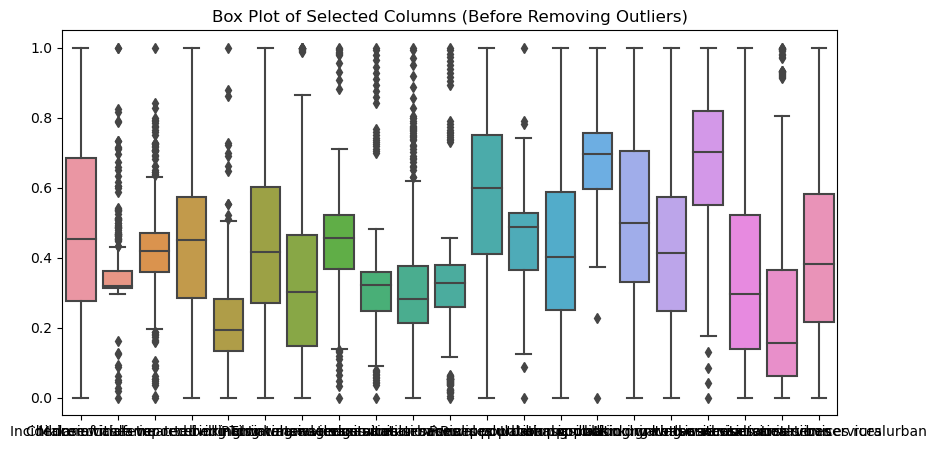


Outliers_removed DataFrame:


,Incidence of malaria,Malaria cases reported,insecticide-treated bed nets,Children with fever receiving antimalarial drugs,IPT,drinking water services,drinking water services rural,drinking water services urban,managed sanitation services,sanitation services rural,...,Rural population,Rural population growth,Urban population,urban population growth,basic drinking water services,basic drinking water services rural,basic drinking water services urban,basic sanitation services,basic sanitation services rural,basic sanitation services urban
0,0.257181,0.314625,0.460139,0.125561,0.130626,0.504190,0.691103,0.397377,0.195796,0.257073,...,0.298660,0.270398,0.701340,0.610788,0.884501,0.830877,0.892716,0.851068,0.648694,0.909823
2,0.866414,0.314624,0.412996,0.730678,0.316283,0.224012,0.087434,0.347019,0.341216,0.344055,...,0.599343,0.516129,0.400657,0.725311,0.491045,0.457478,0.505740,0.071677,0.020744,0.114092
3,0.258475,0.314640,0.285913,0.166698,0.190906,0.811954,0.691595,0.678859,0.380676,0.239155,...,0.392442,0.190702,0.607558,0.784232,0.704132,0.489853,0.883740,0.595832,0.329317,0.755016
4,0.896302,0.316427,0.363303,0.677533,0.232870,0.172261,0.139209,0.315405,0.282623,0.216509,...,0.833923,0.532258,0.166077,0.876349,0.328727,0.339212,0.503861,0.111672,0.038809,0.395590
5,0.539971,0.359510,0.463860,0.438035,0.134496,0.440297,0.224320,0.554575,0.447773,0.616588,...,1.000000,0.613852,0.000000,0.868880,0.363418,0.414835,0.693592,0.430692,0.383512,0.352310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
583,0.719113,0.381903,0.619048,0.681155,0.449664,0.144498,0.135469,0.254930,0.130122,0.116450,...,0.598332,0.465844,0.401668,0.646473,0.449161,0.399734,0.495721,0.112199,0.057306,0.152473
584,0.304272,0.316055,0.356813,0.297891,0.073536,0.353074,0.421123,0.374516,0.220383,0.090271,...,0.563574,0.496205,0.436426,0.726971,0.331124,0.133607,0.644959,0.351016,0.157917,0.566029
585,0.262179,0.315541,0.327295,0.124187,0.200868,0.973656,0.864520,0.666585,0.343910,0.385997,...,0.292341,0.320683,0.707659,0.566805,0.898604,0.768664,0.978710,0.744764,0.629073,0.743467
587,0.316477,0.343996,0.464780,0.445627,0.116993,0.242527,0.351995,0.219845,0.226287,0.164155,...,0.690217,0.518975,0.309783,0.644813,0.441546,0.436700,0.453976,0.332491,0.193096,0.554830



Percentage of Missing Values in Normalized DataFrame:
Incidence of malaria                                0.0
Malaria cases reported                              0.0
insecticide-treated bed nets                        0.0
Children with fever receiving antimalarial drugs    0.0
IPT                                                 0.0
drinking water services                             0.0
drinking water services rural                       0.0
drinking water services urban                       0.0
managed sanitation services                         0.0
sanitation services rural                           0.0
sanitation services urban                           0.0
Rural population                                    0.0
Rural population growth                             0.0
Urban population                                    0.0
urban population growth                             0.0
basic drinking water services                       0.0
basic drinking water services rural              

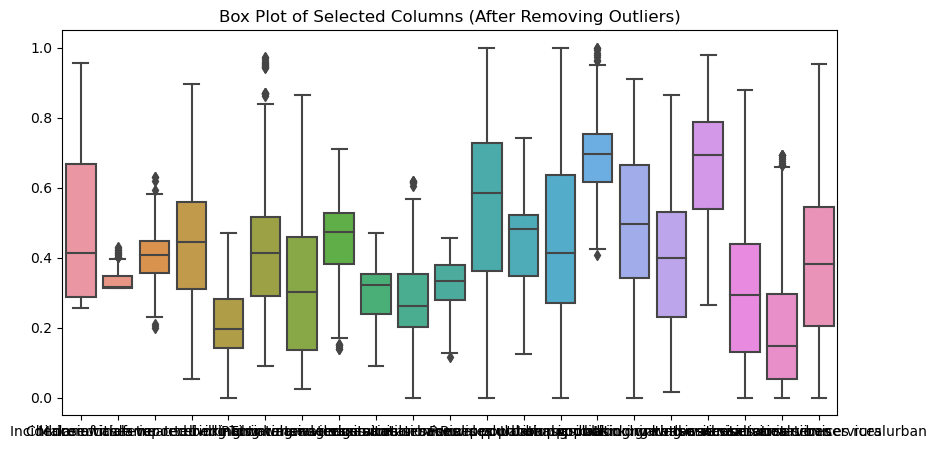

In [47]:
# Extract columns of interest with high percentages of missing data
columns_of_interest = ["Use of insecticide-treated bed nets (% of under-5 population)",
                       "Children with fever receiving antimalarial drugs (% of children under age 5 with fever)",
                       "Intermittent preventive treatment (IPT) of malaria in pregnancy (% of pregnant women)",
                       "People using safely managed drinking water services (% of population)",
                       "People using safely managed drinking water services, rural (% of rural population)",
                       "People using safely managed drinking water services, urban (% of urban population)",
                       "People using safely managed sanitation services (% of population)",
                       "People using safely managed sanitation services, rural (% of rural population)",
                       "People using safely managed sanitation services, urban  (% of urban population)"]

# Prepare the data for multiple imputation (exclude non-numeric columns)
numeric_values = df.drop(["Country Name", "Year", "Country Code", "geometry"], axis=1)

# Perform multiple imputation using IterativeImputer
imputer = IterativeImputer()
imputed_values = imputer.fit_transform(numeric_values)

# Convert the imputed array back to a DataFrame
df_imputed = pd.DataFrame(imputed_values, columns=numeric_values.columns)

# Merge the imputed numeric values with the non-numeric columns
non_numeric = df[["Country Name", "Year", "Country Code", "geometry", "latitude", "longitude"]]
df_combined = pd.concat([non_numeric, df_imputed], axis=1)


# Normalize the selected columns using Min-Max scaling
scaler = MinMaxScaler()
normalized_data = scaler.fit_transform(df_combined.drop(["Country Name", "Year", "Country Code", "geometry", "latitude", "longitude"], axis=1))

# Convert the normalized_data array back to a DataFrame with column names
normalized_df = pd.DataFrame(normalized_data, columns=["Incidence of malaria","Malaria cases reported","insecticide-treated bed nets","Children with fever receiving antimalarial drugs","IPT","drinking water services","drinking water services rural","drinking water services urban","managed sanitation services","sanitation services rural","sanitation services urban","Rural population","Rural population growth","Urban population","urban population growth","basic drinking water services","basic drinking water services rural","basic drinking water services urban","basic sanitation services","basic sanitation services rural","basic sanitation services urban"])

# Display the normalized DataFrame
print("\nNormalized DataFrame:")
display(normalized_df)

# Create a box plot to identify outliers using IQR method
plt.figure(figsize=(10, 5))
sns.boxplot(data=normalized_df)
plt.title('Box Plot of Selected Columns (Before Removing Outliers)')
plt.show()

# Remove outliers using IQR (Interquartile Range) method
Q1 = normalized_df.quantile(0.25)
Q3 = normalized_df.quantile(0.75)
IQR = Q3 - Q1
outliers_removed = normalized_df[~((normalized_df < (Q1 - 1.5 * IQR)) | (normalized_df > (Q3 + 1.5 * IQR))).any(axis=1)]
df = pd.concat([non_numeric, normalized_df], axis=1)

# Display the outliers_removed DataFrame
print("\nOutliers_removed DataFrame:")
display(outliers_removed)


# Recalculate the percentage of missing values in the normalized DataFrame
missing_percentage = (normalized_df.isnull().sum() / normalized_df.shape[0]) * 100

# Print the percentage of missing values for each column
print("\nPercentage of Missing Values in Normalized DataFrame:")
print(missing_percentage)


# Create a box plot after removing outliers
plt.figure(figsize=(10, 5))
sns.boxplot(data=outliers_removed)
plt.title('Box Plot of Selected Columns (After Removing Outliers)')
plt.show()


### Study the countries with the highest number of malaria cases per annum.

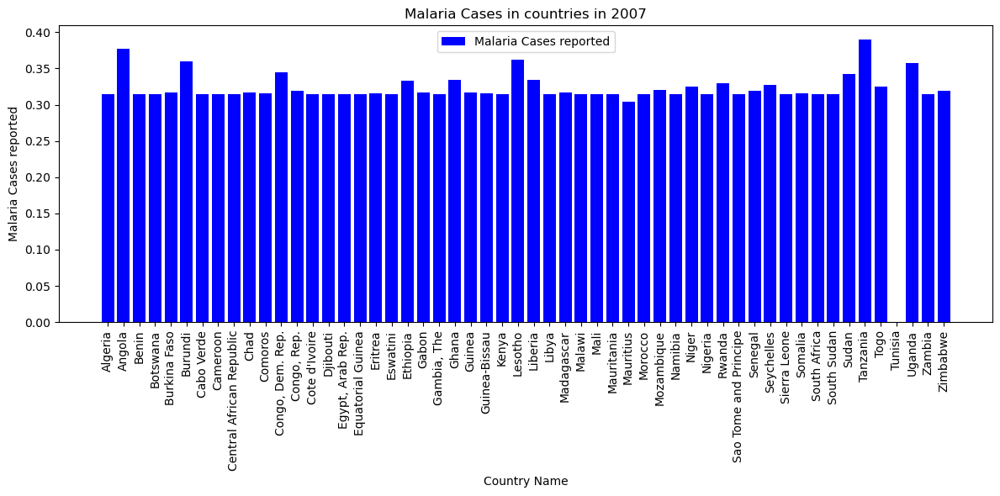

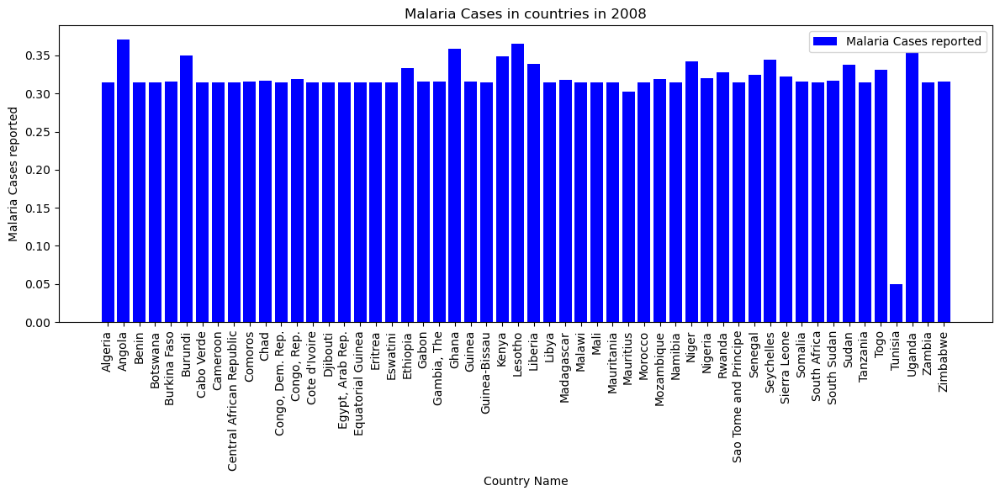

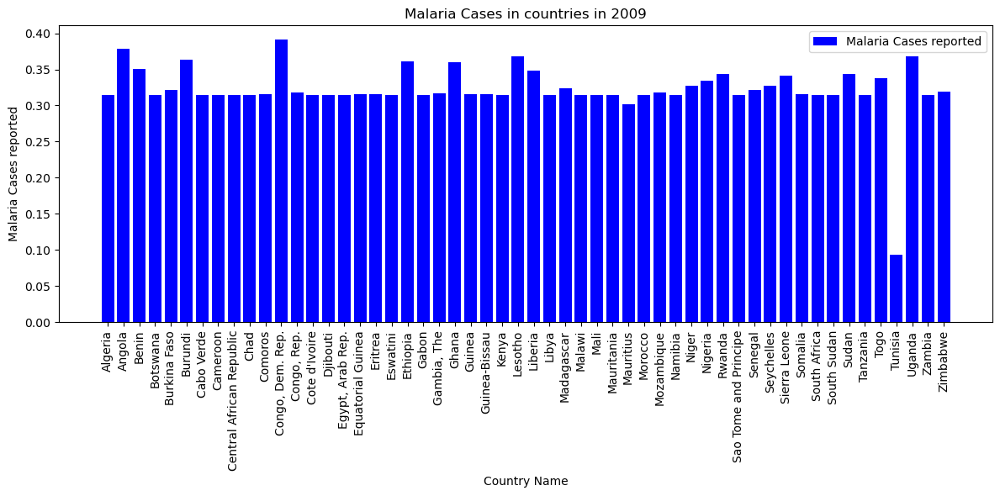

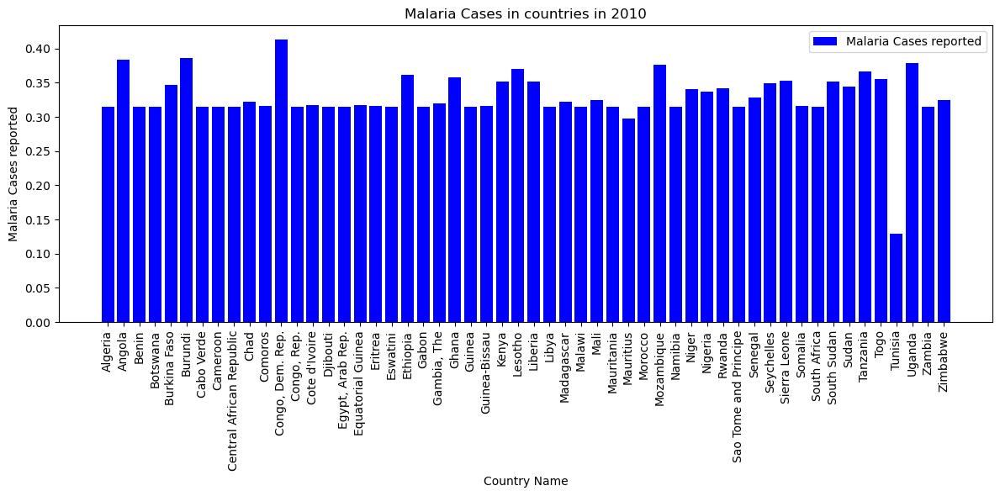

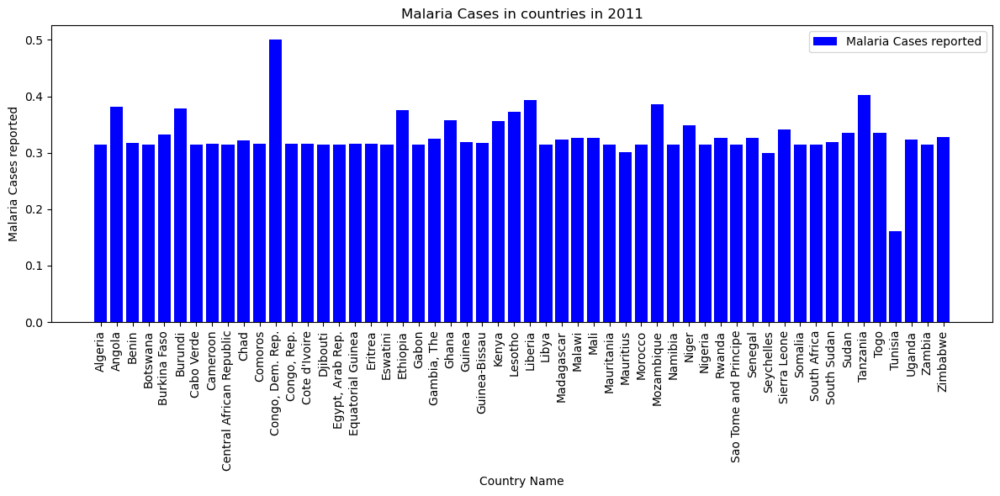

...

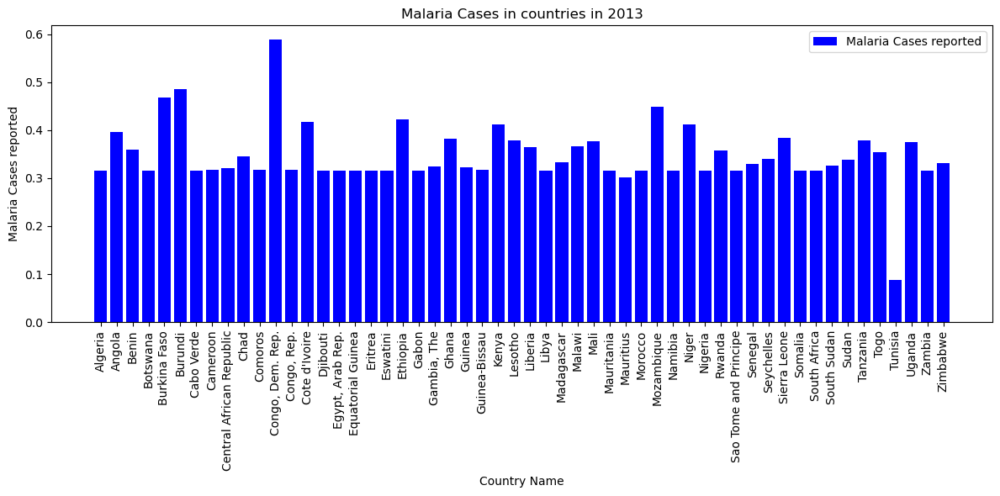

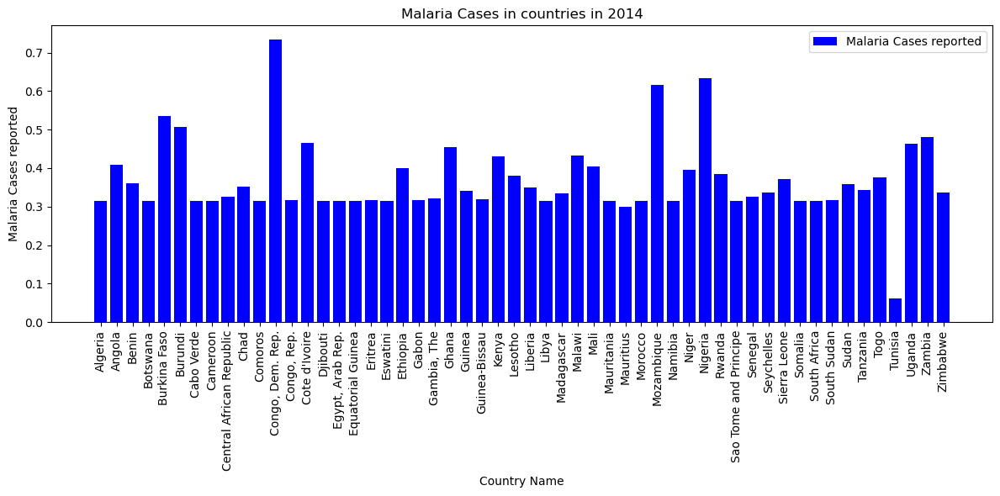

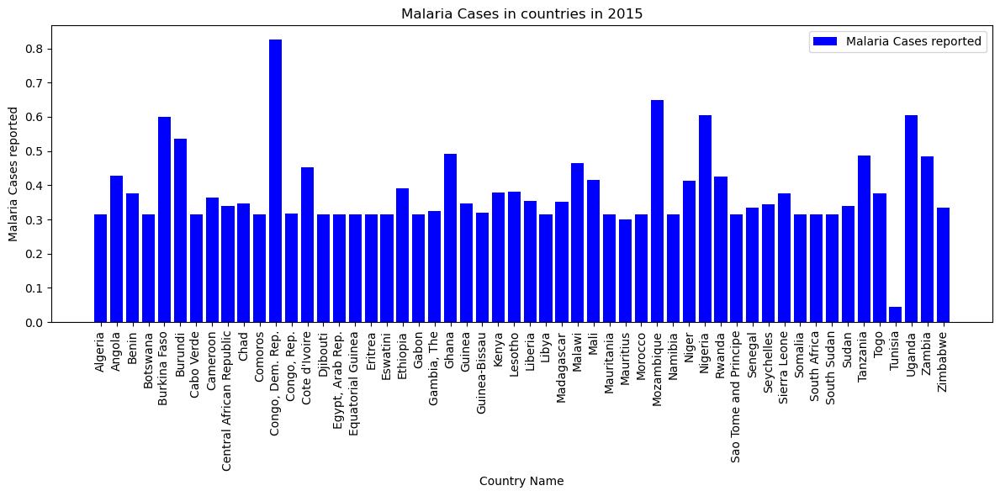

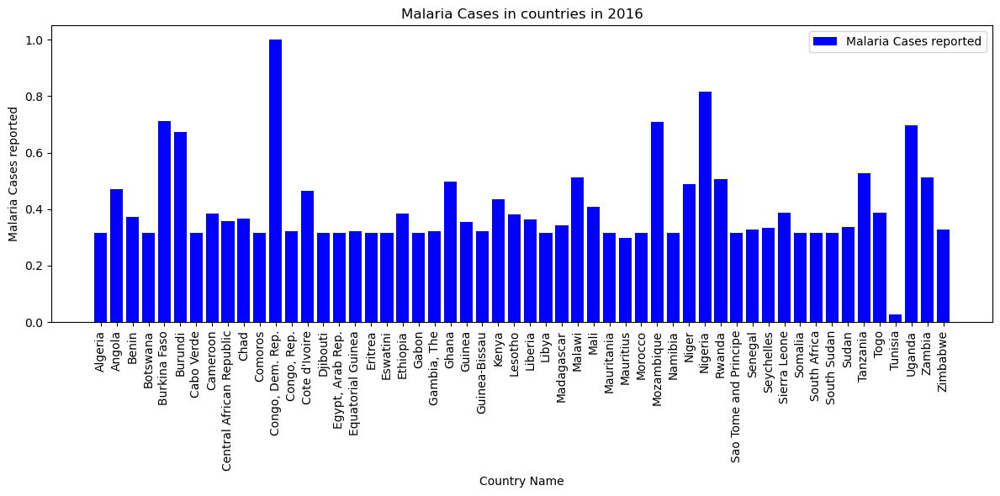

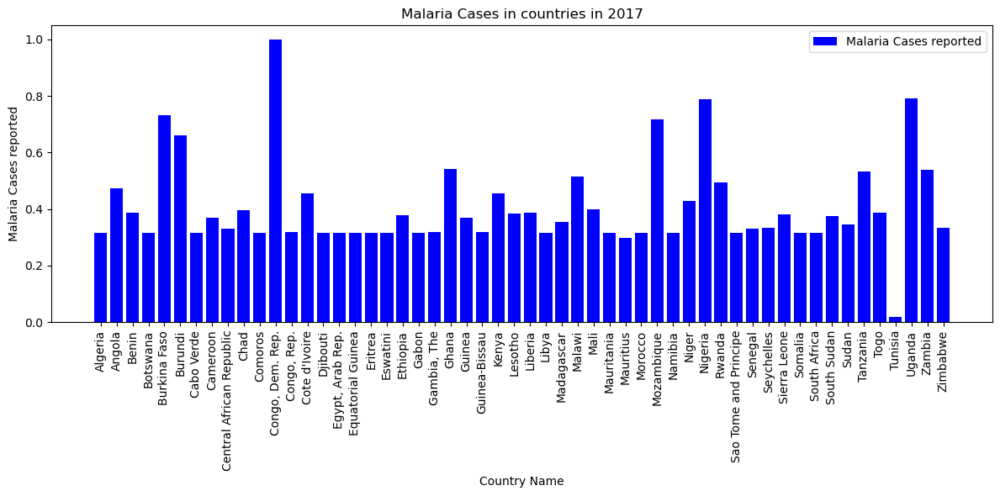

In [48]:
## Ssali Benjamin Tamale 21/U/13703/EVE

# Group the data by country and calculate the average incidence of malaria cases
average_incidence_by_country = df.groupby("Year")
for name, group in average_incidence_by_country:
    # Visualize the top countries with the highest average incidence and their corresponding number of malaria cases
    plt.figure(figsize=(12, 6))
    plt.bar(group["Country Name"], group["Malaria cases reported"], color='blue', label='Malaria Cases reported')
    plt.xlabel('Country Name')
    plt.ylabel('Malaria Cases reported')
    plt.title(f'Malaria Cases in countries in {name}')
    plt.legend()
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()


As years increase, Congo, Dem. Republic has the highest increasing malaria cases while Tunisia has reducing malaria cases

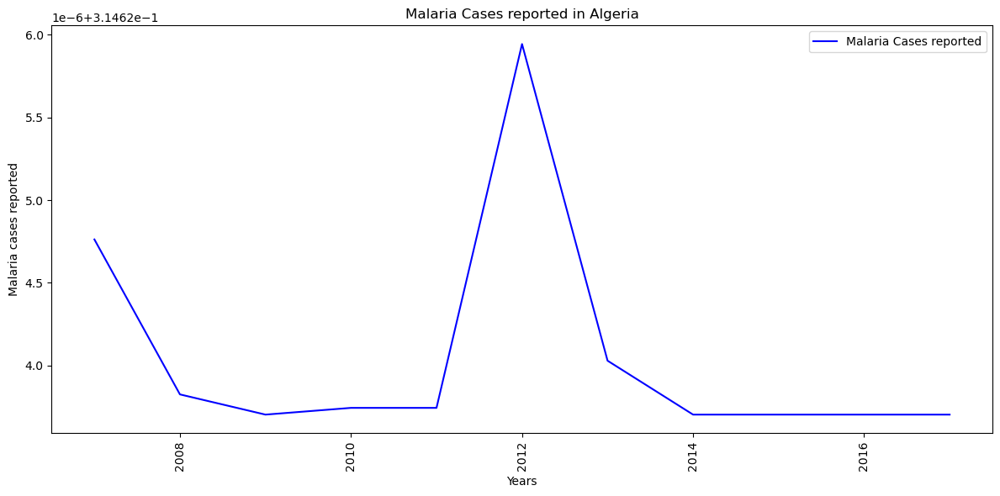

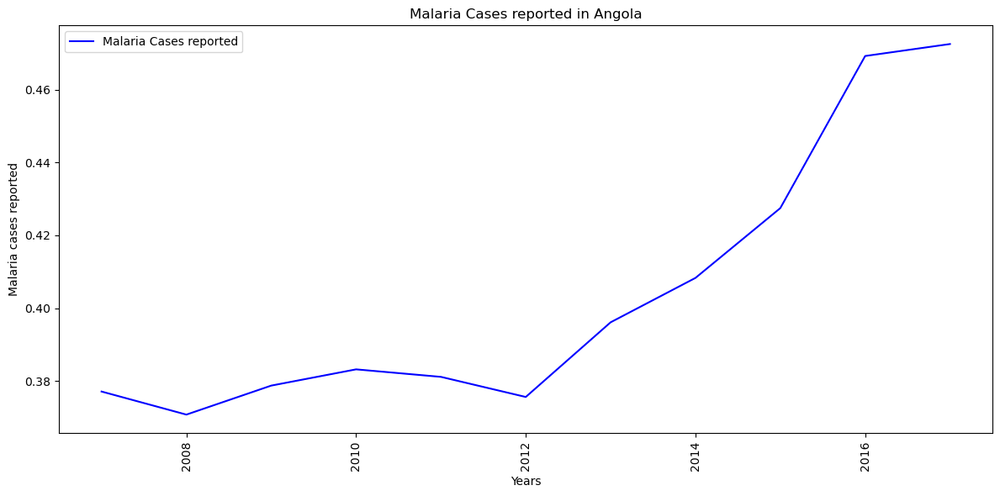

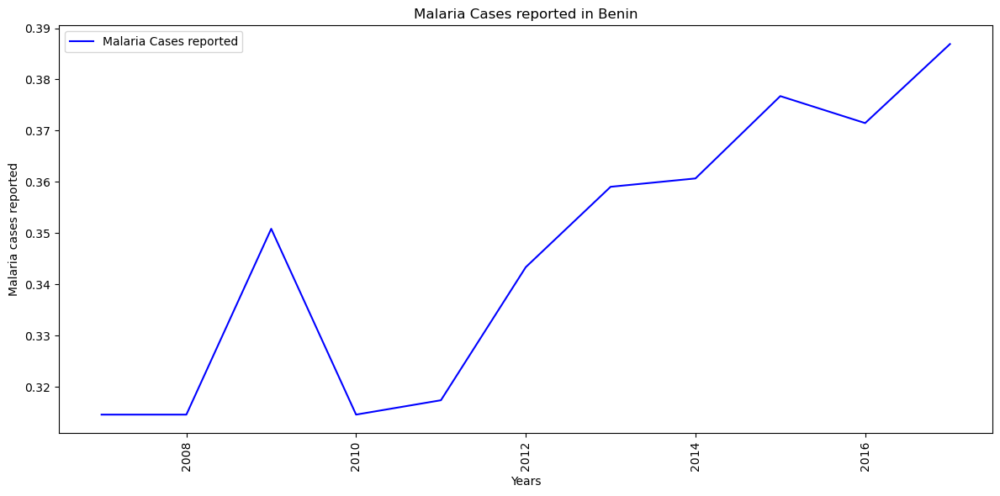

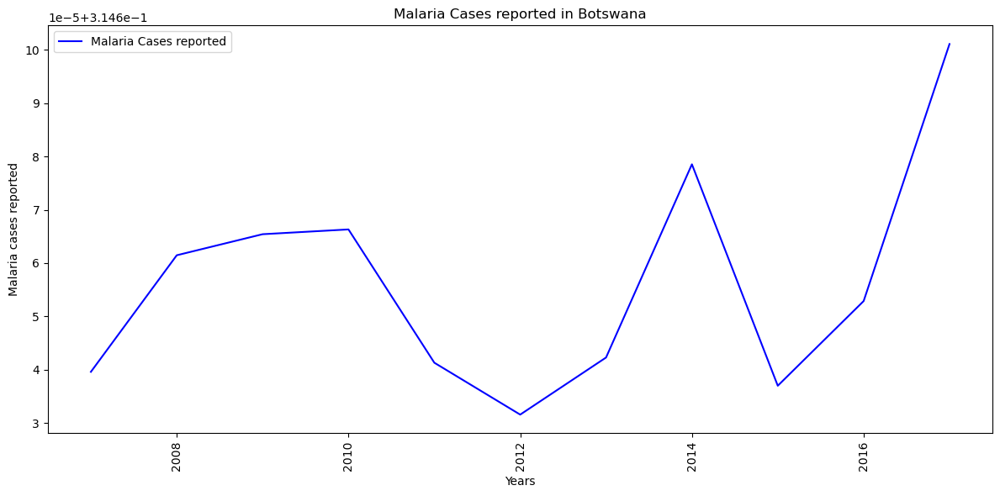

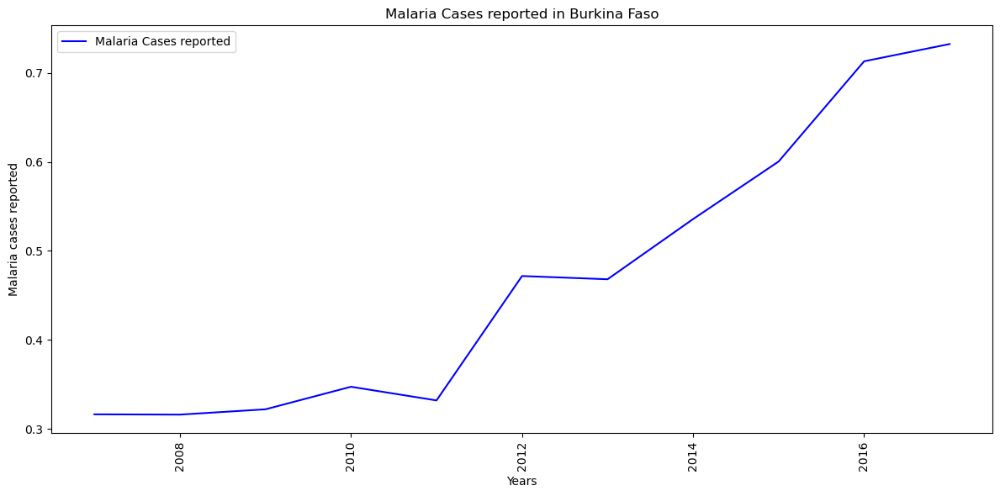

...

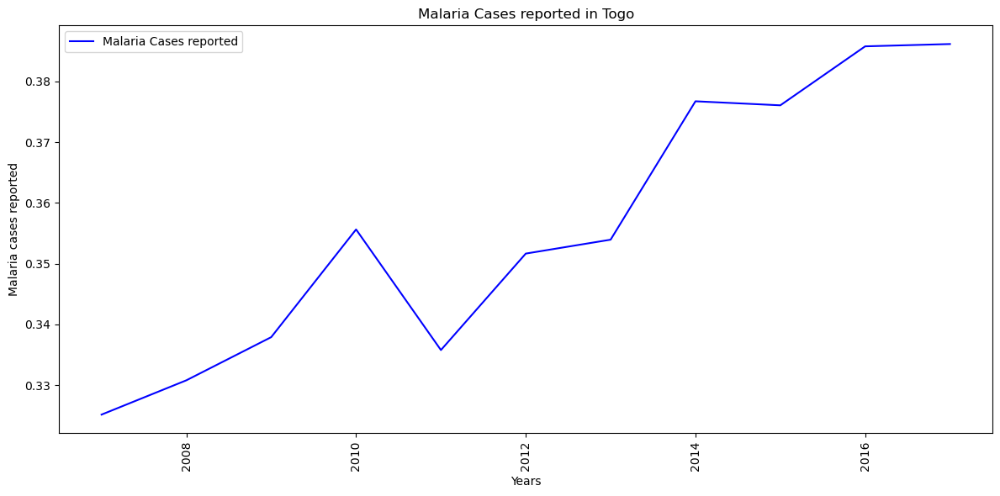

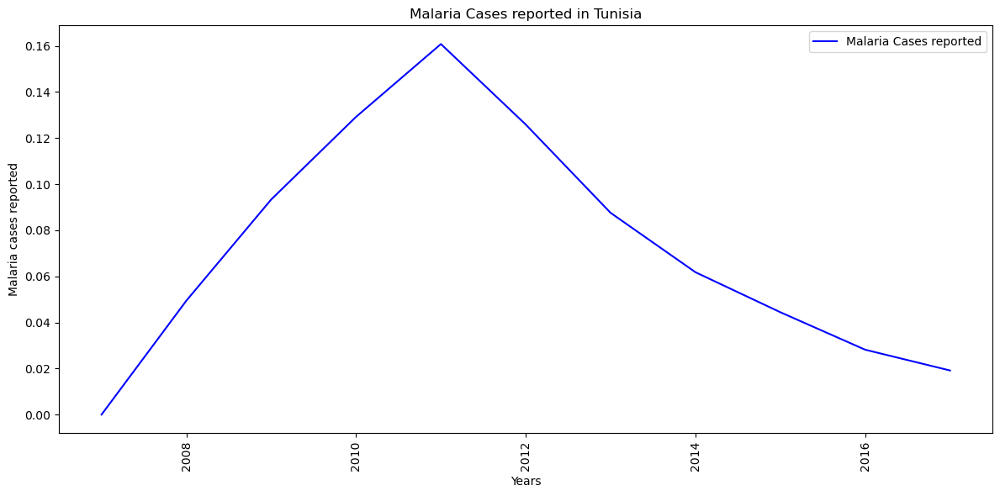

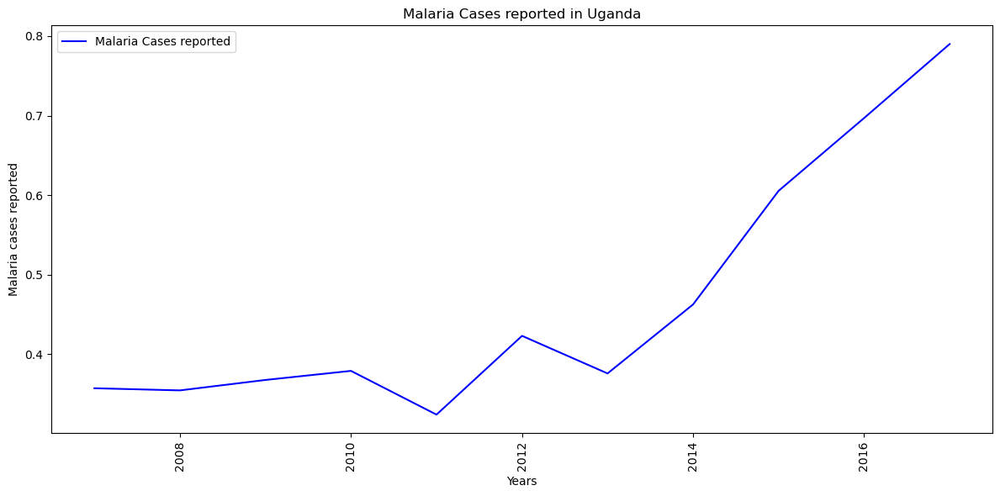

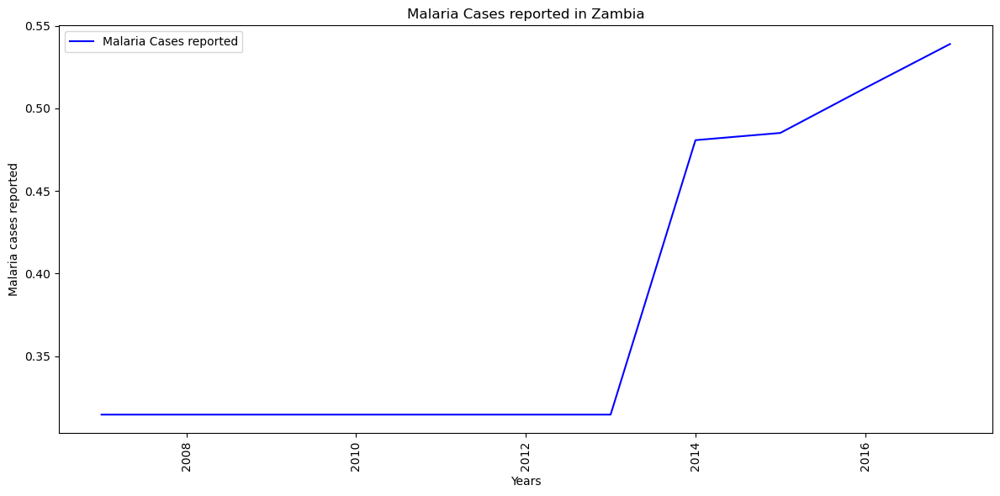

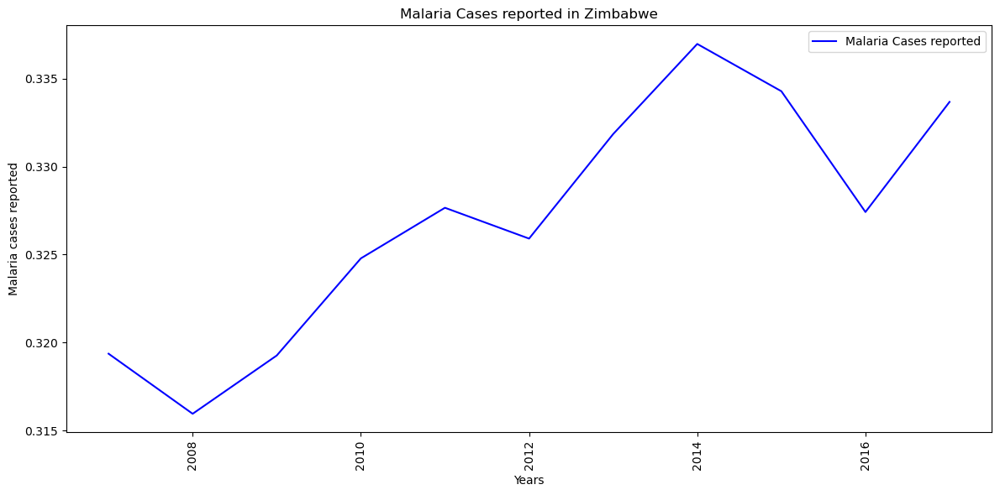

In [49]:
# Group the data by country and calculate the average incidence of malaria cases
average_incidence_by_country = df.groupby("Country Name")
for name, group in average_incidence_by_country:
    # Visualize the top countries with the highest average incidence and their corresponding number of malaria cases
    plt.figure(figsize=(12, 6))
    plt.plot(group["Year"].values, group["Malaria cases reported"].values, color='blue', label='Malaria Cases reported')
    plt.xlabel('Years')
    plt.ylabel('Malaria cases reported')
    plt.title(f'Malaria Cases reported in {name}')
    plt.legend()
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

Study the Countries with the highest number of malaria cases.

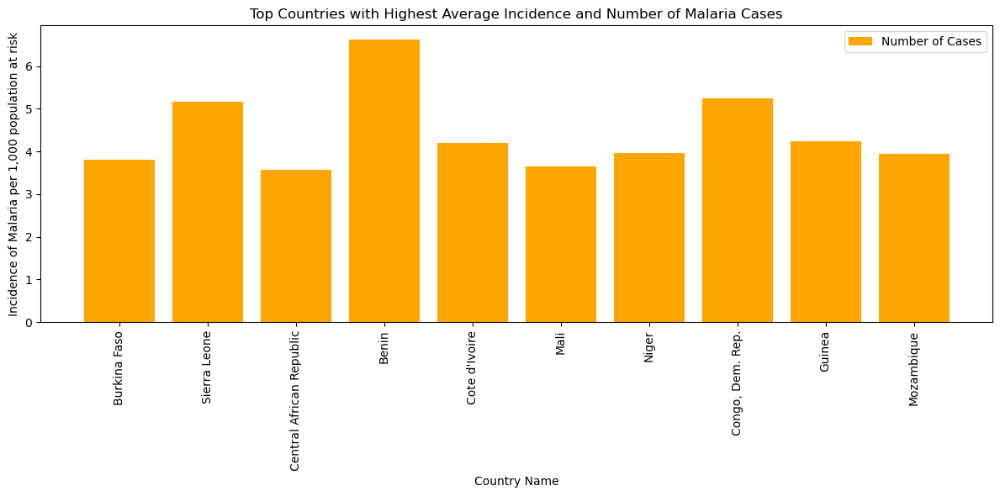

In [65]:
# Group the data by country and calculate the average incidence of malaria cases
average_incidence_by_country = df.groupby("Country Name")["Incidence of malaria"].mean()

# Sort the countries based on the average incidence in descending order
sorted_countries = average_incidence_by_country.sort_values(ascending=False)

# Select the top N countries with the highest average incidence
top_countries = sorted_countries.head(10)

# Get the number of malaria cases for the top countries
number_of_cases_by_country = df[df["Country Name"].isin(top_countries.index)]
number_of_cases_by_country = number_of_cases_by_country.groupby("Country Name")["Malaria cases reported"].sum()

# Visualize the top countries with the highest average incidence and their corresponding number of malaria cases
plt.figure(figsize=(12, 6))
plt.bar(top_countries.index, number_of_cases_by_country.values, color='orange', label='Number of Cases')
plt.xlabel('Country Name')
plt.ylabel('Incidence of Malaria per 1,000 population at risk')
plt.title('Top Countries with Highest Average Incidence and Number of Malaria Cases')
plt.legend()
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()







In [64]:
# Get the latitude and longitude for each country
country_coordinates = df
country_coordinates = country_coordinates.drop_duplicates("Country Name")

# Create the map
map_center = [country_coordinates["latitude"].mean(), country_coordinates["longitude"].mean()]
malaria_map = folium.Map(location=map_center, zoom_start=3)

# Add markers for each country
for index, row in country_coordinates.iterrows():
    country_name = row["Country Name"]
    latitude = row["latitude"]
    longitude = row["longitude"]

    popup_text = f"{country_name}<br>Average Incidence:"
    folium.Marker(location=[latitude, longitude], popup=popup_text).add_to(malaria_map)

# Display the map
malaria_map

### How using safely managed drinking water affects the number of malaria cases reported per Year.

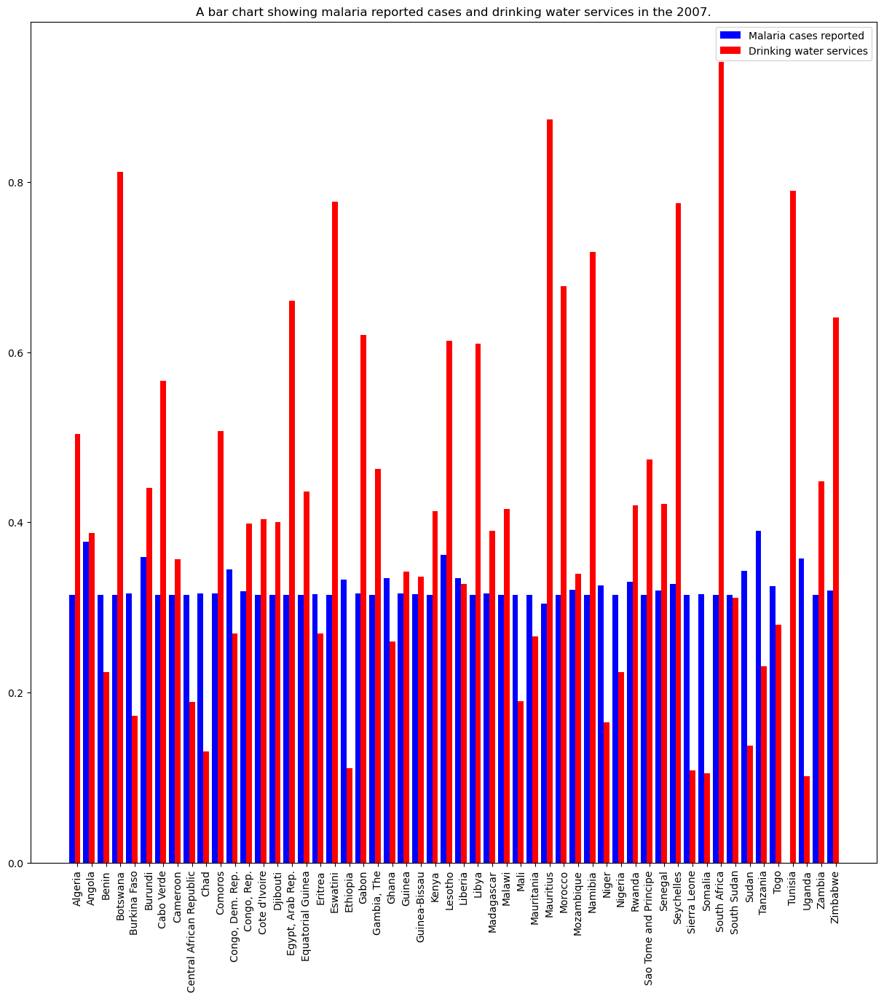

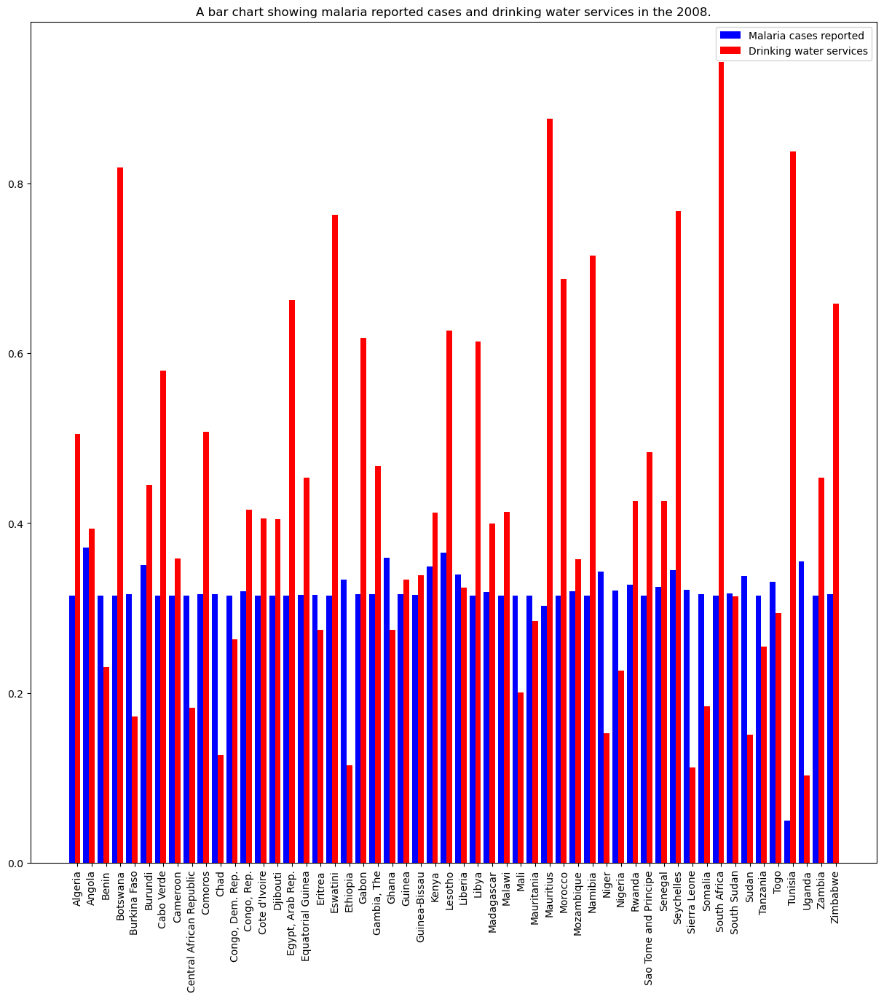

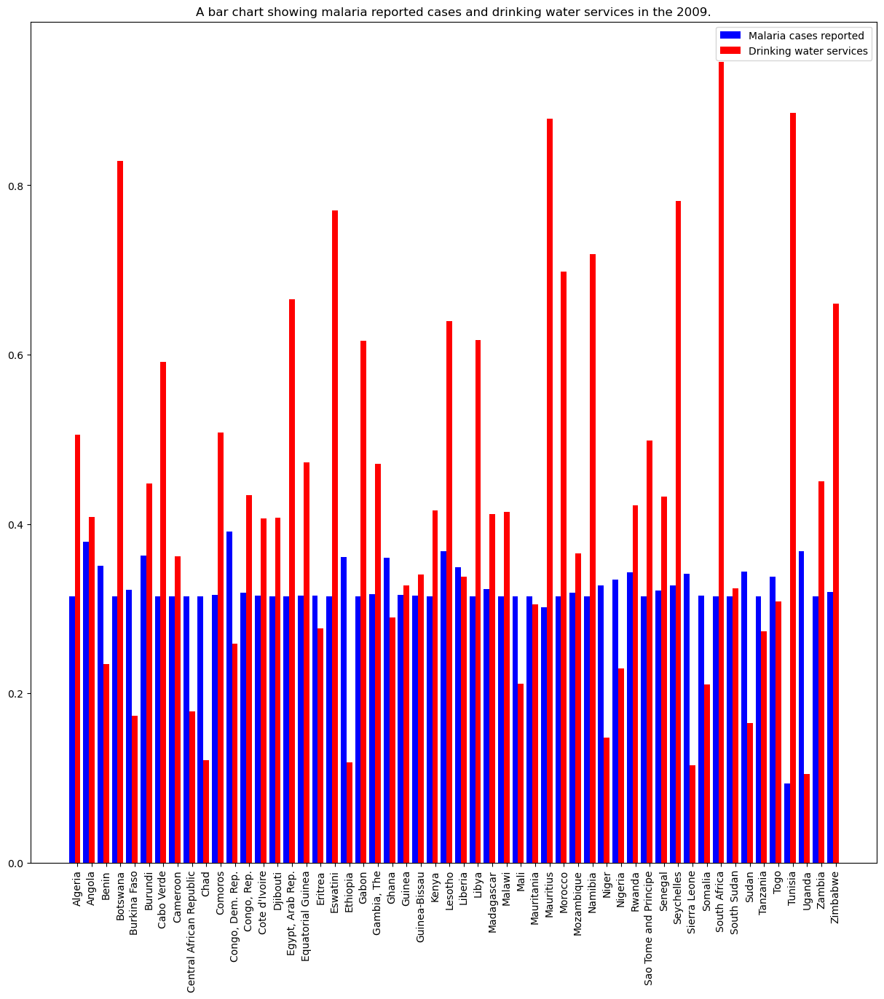

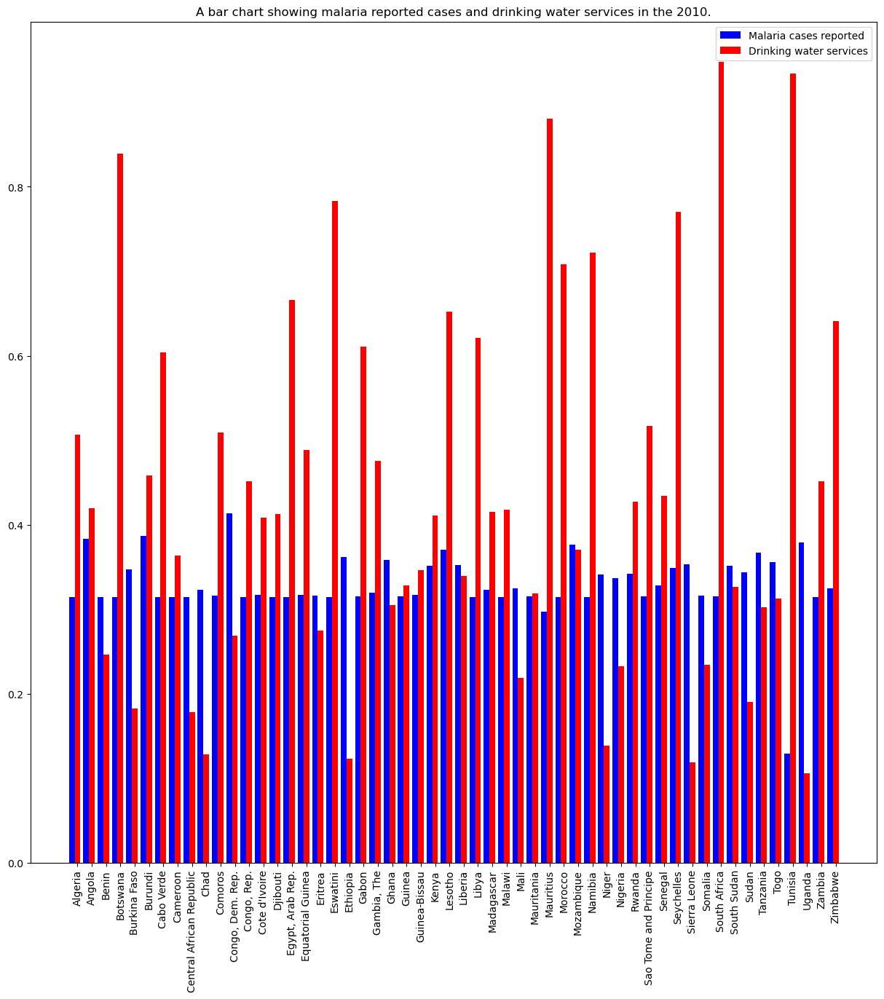

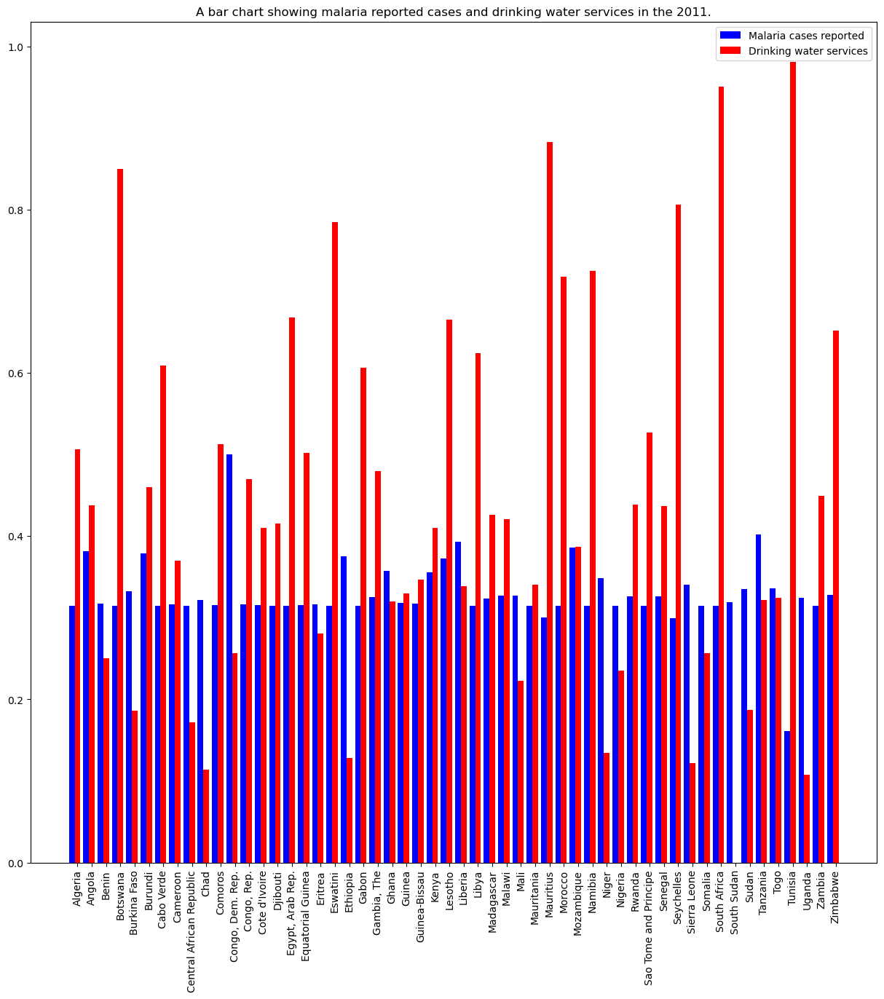

...

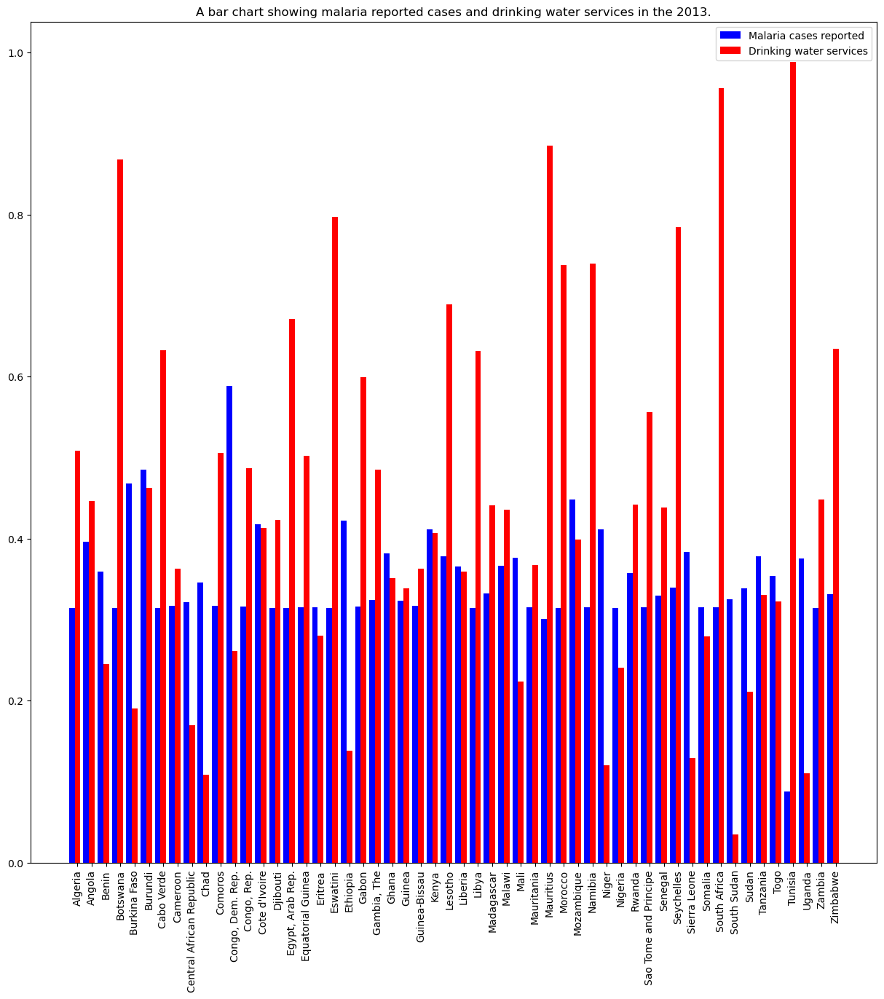

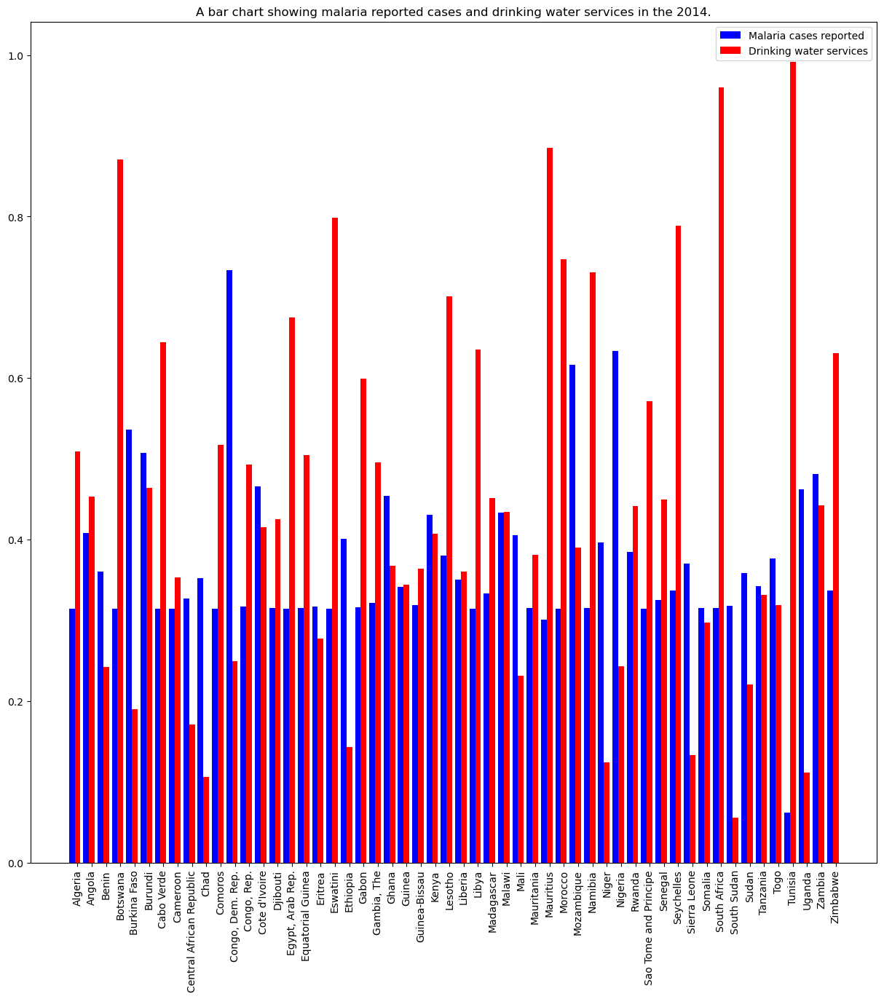

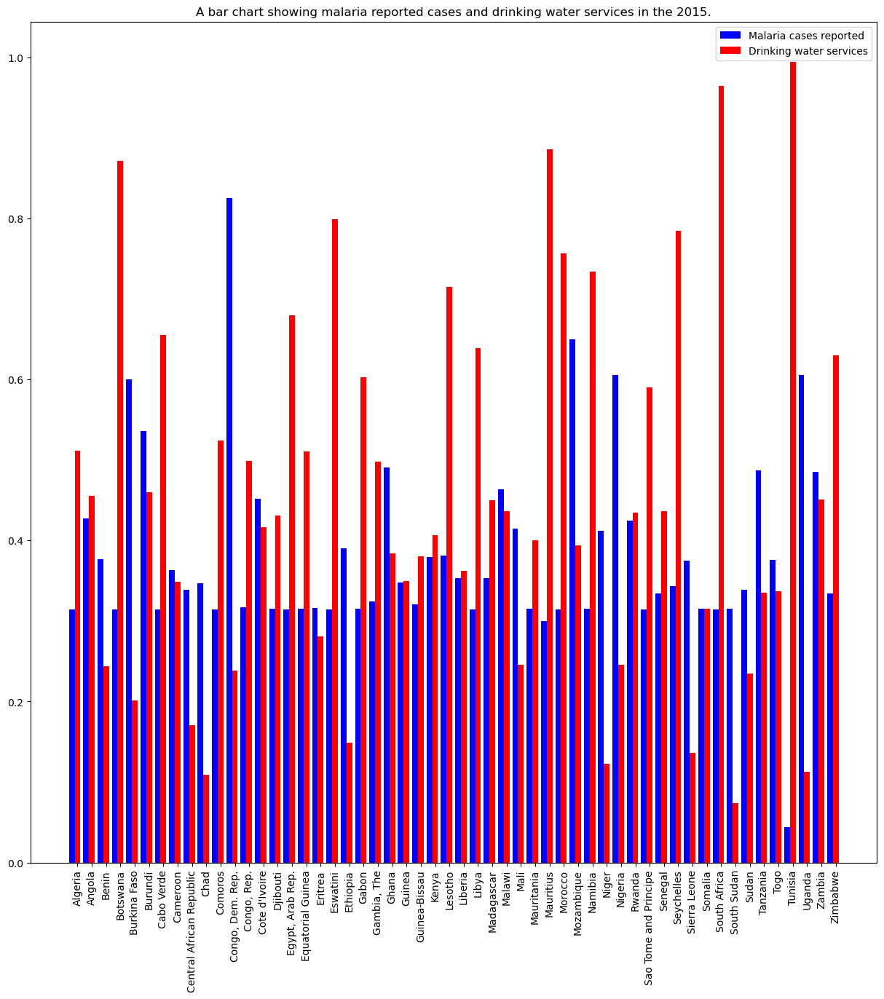

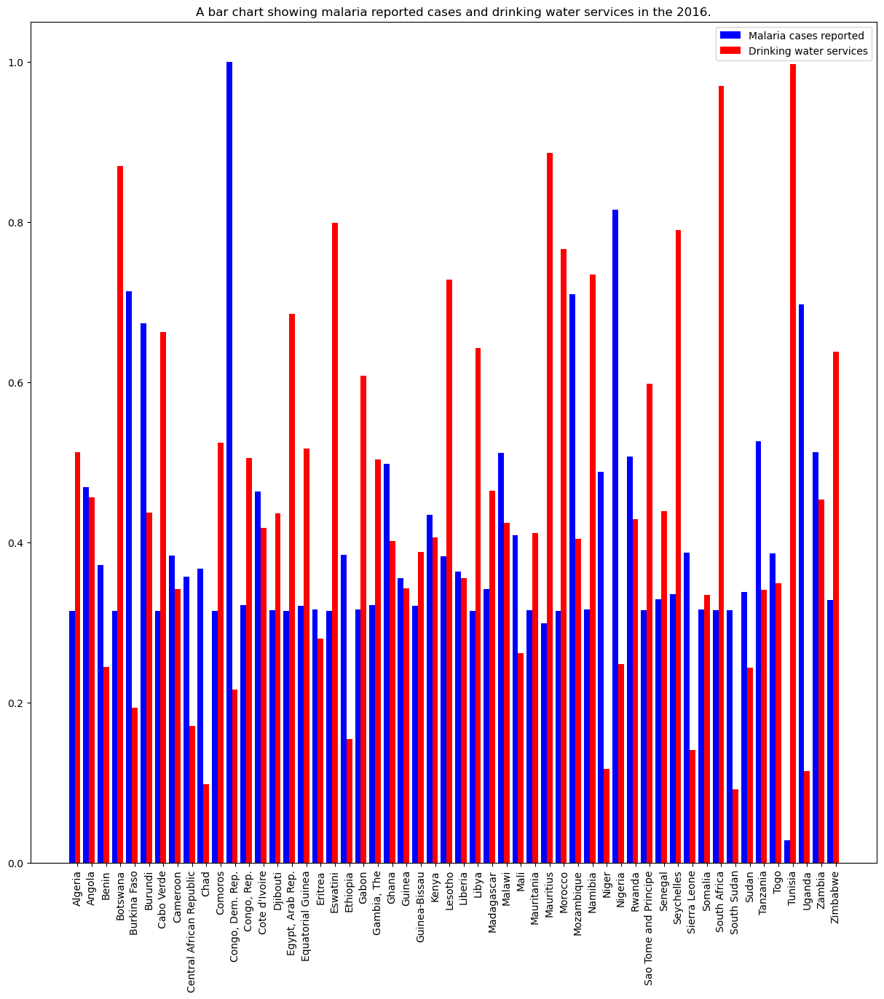

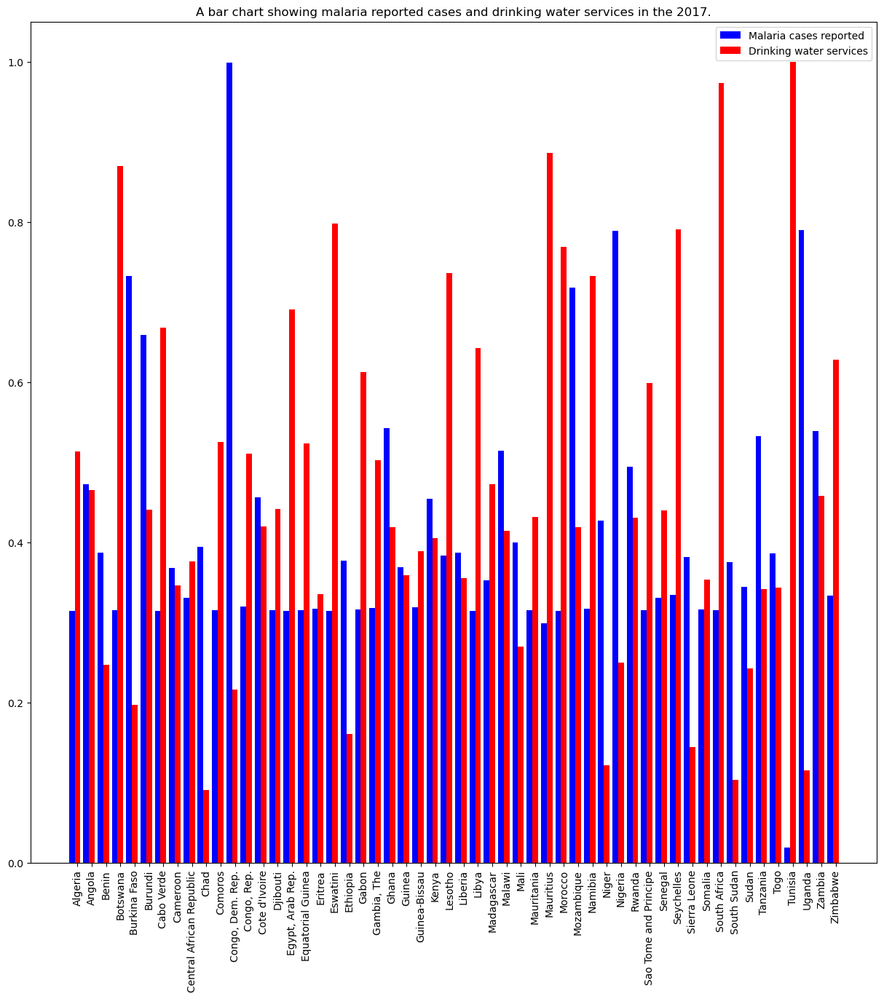

In [52]:
# Group the data by country and calculate the average incidence of malaria cases
average_incidence_by_country = df.groupby("Year")

for name, group in average_incidence_by_country:
    fig, ax = plt.subplots(1,1, figsize=(15,15))
    x = np.arange(len(group["Country Name"].values))
    w =0.4
    ax.bar(x-w, group["Malaria cases reported"], width=w, color='b', label='Malaria cases reported', align='center')
    ax.bar(x, group["drinking water services"], width=w, color='r', label='Drinking water services',align='center')
    ax.set_xticks(np.arange(len(group["Country Name"].values)))
    ax.set_xticklabels(list(group["Country Name"].values))
    plt.xticks(rotation='vertical')
    plt.legend()
    plt.title(f"A bar chart showing malaria reported cases and drinking water services in the {name}.")
    plt.show()
 


# Heat map to show the correlation between 

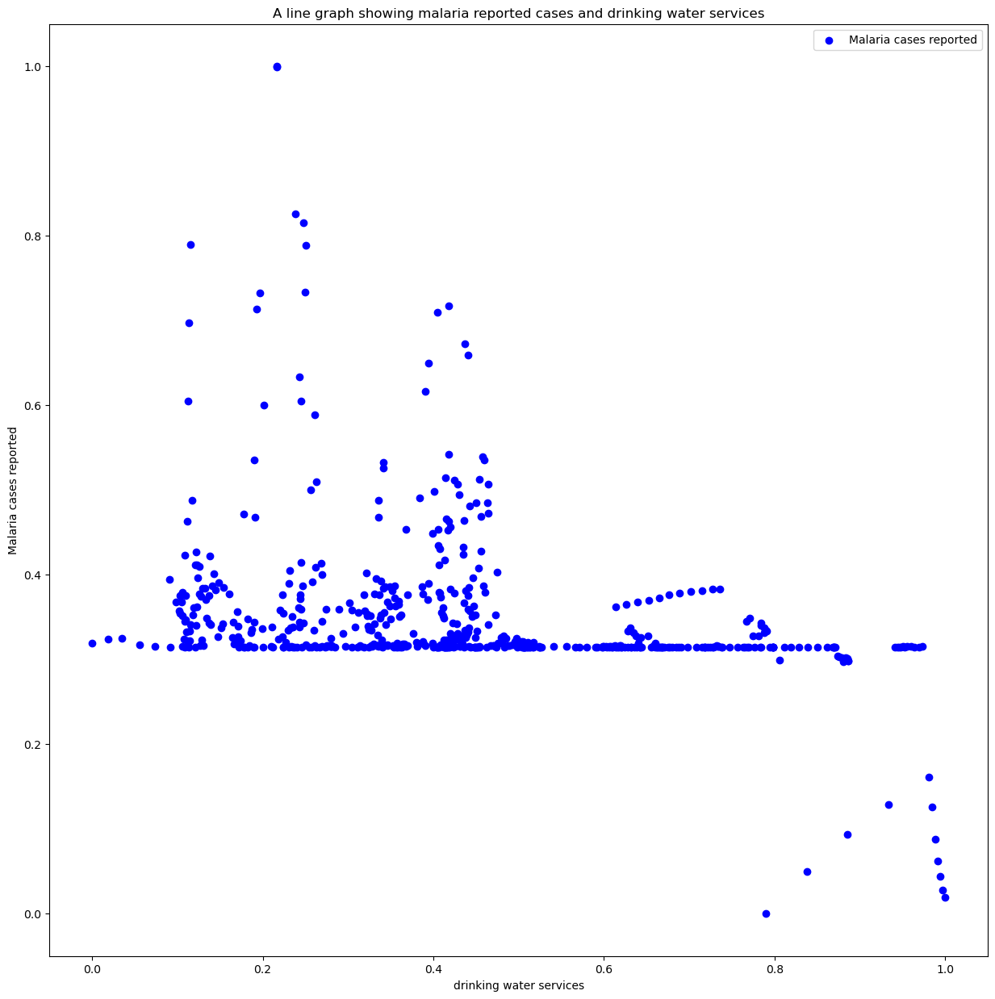

In [53]:
# Group the data by country and calculate the average incidence of malaria cases
fig, ax = plt.subplots(1,1, figsize=(15,15))
ax.scatter(df["drinking water services"].values,df["Malaria cases reported"].values, color='b', label='Malaria cases reported')
plt.legend()
plt.title(f"A line graph showing malaria reported cases and drinking water services")
plt.xlabel("drinking water services")
plt.ylabel("Malaria cases reported")
plt.show()

<AxesSubplot:>

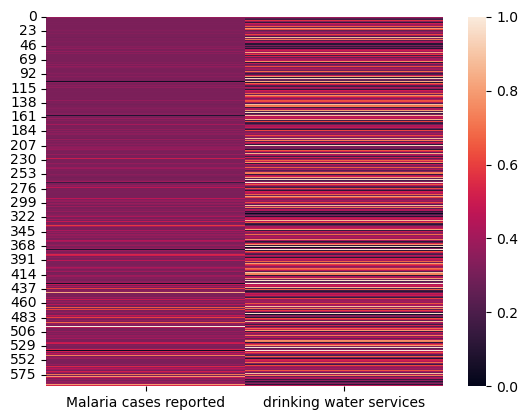

In [54]:
# Heat map describing the correlation
sns.heatmap(df[["Malaria cases reported", "drinking water services"]])

In [55]:
df[["Malaria cases reported", "drinking water services"]].corr()

,Malaria cases reported,drinking water services
Malaria cases reported,1.000000,-0.355198
drinking water services,-0.355198,1.000000


### Conclusion
There is no correlation between ther drinking water services and the cases of malaria reported in the country.

# AHWERA SHIFRAH 21/U/14848/EVE

how using safely managed sanitation services affects incidence of malaria(per 1,000 population at risk)

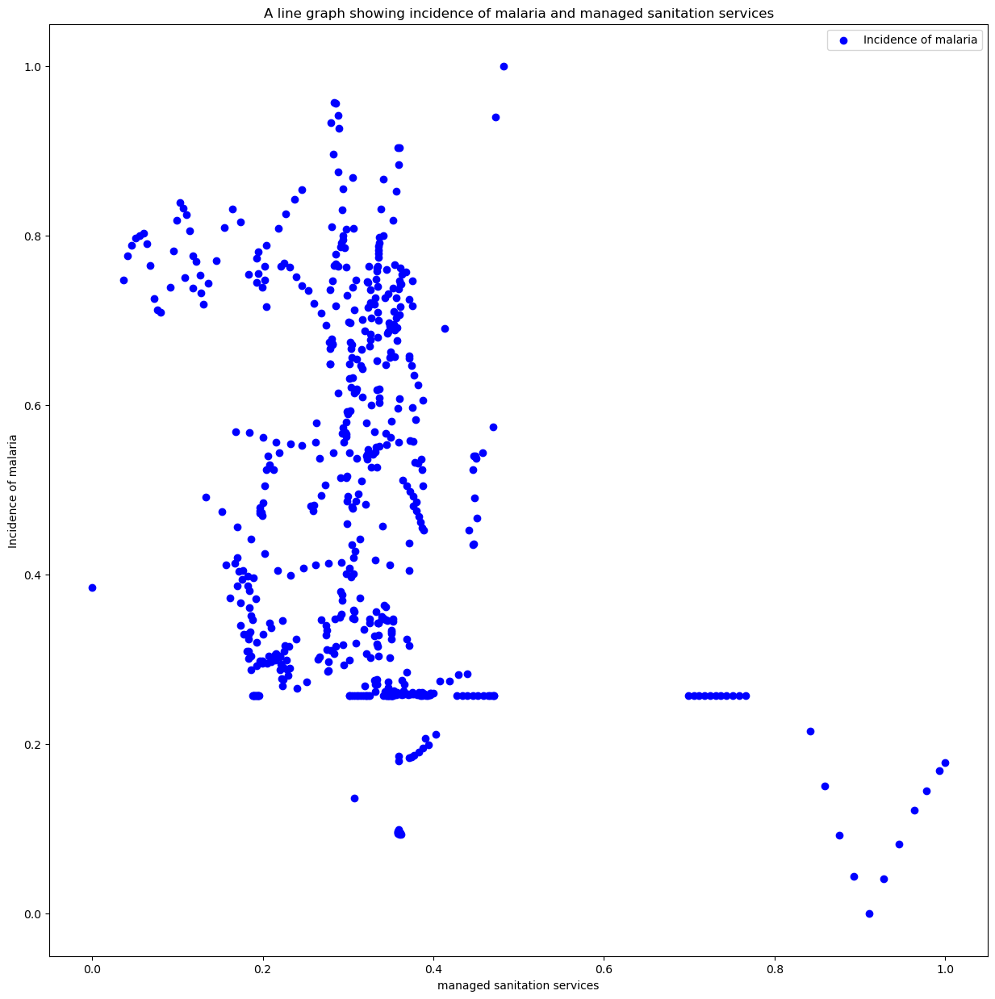

In [56]:
# Group the data by country and calculate the average incidence of malaria cases
fig, ax = plt.subplots(1,1, figsize=(15,15))
ax.scatter(df["managed sanitation services"].values,df["Incidence of malaria"].values, color='b', label='Incidence of malaria')
plt.legend()
plt.title(f"A line graph showing incidence of malaria and managed sanitation services")
plt.xlabel("managed sanitation services")
plt.ylabel("Incidence of malaria")
plt.show()

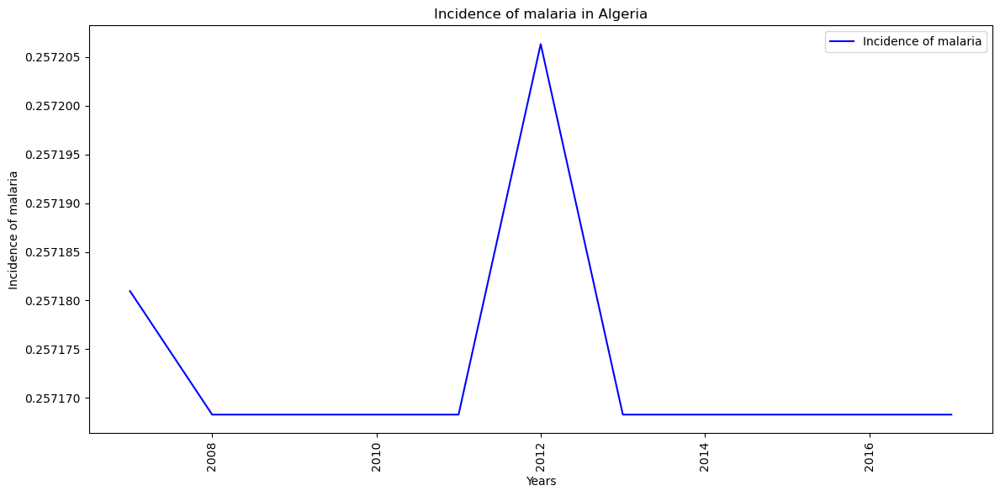

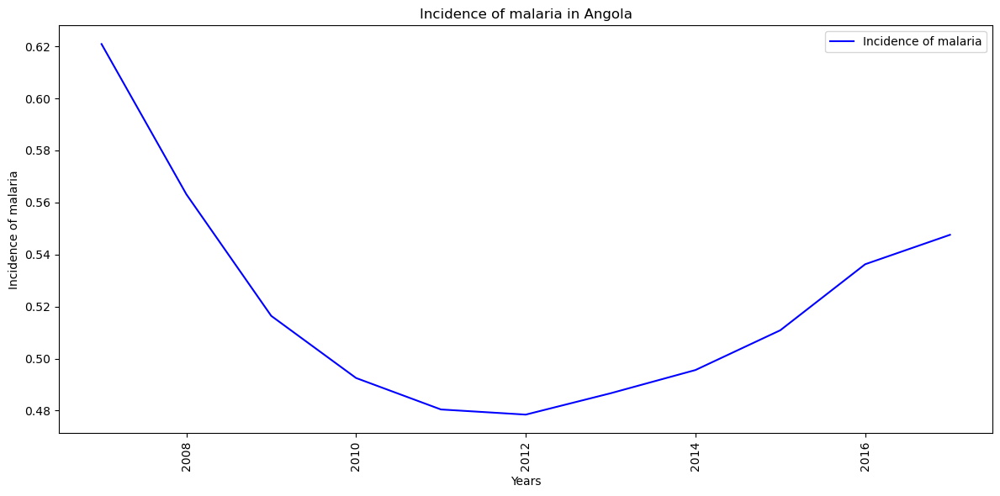

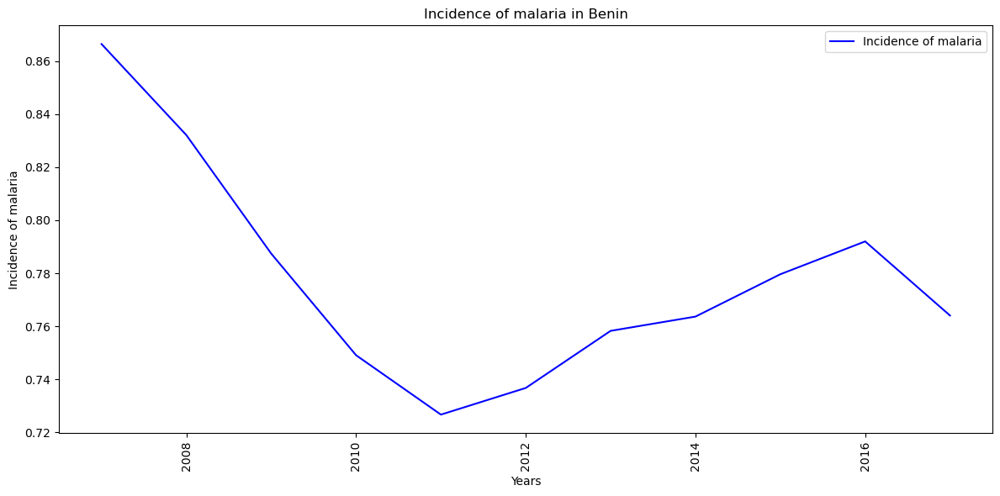

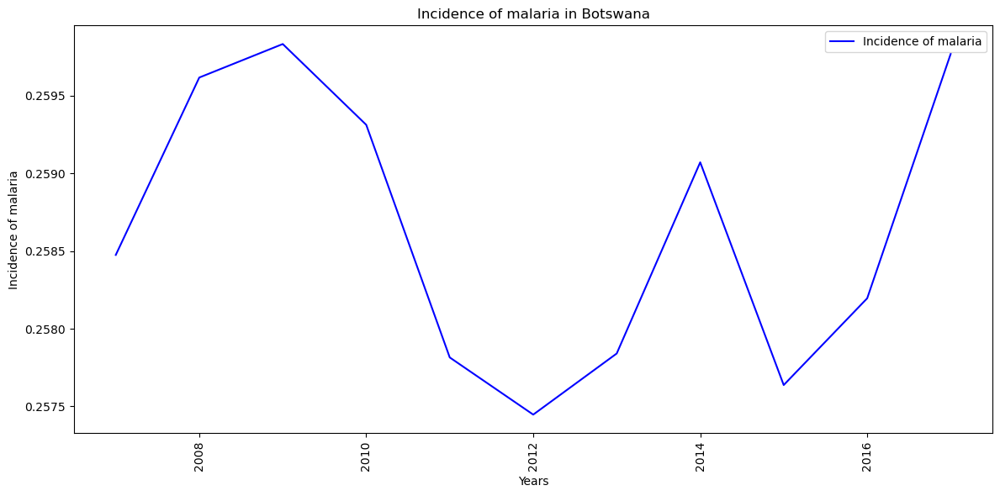

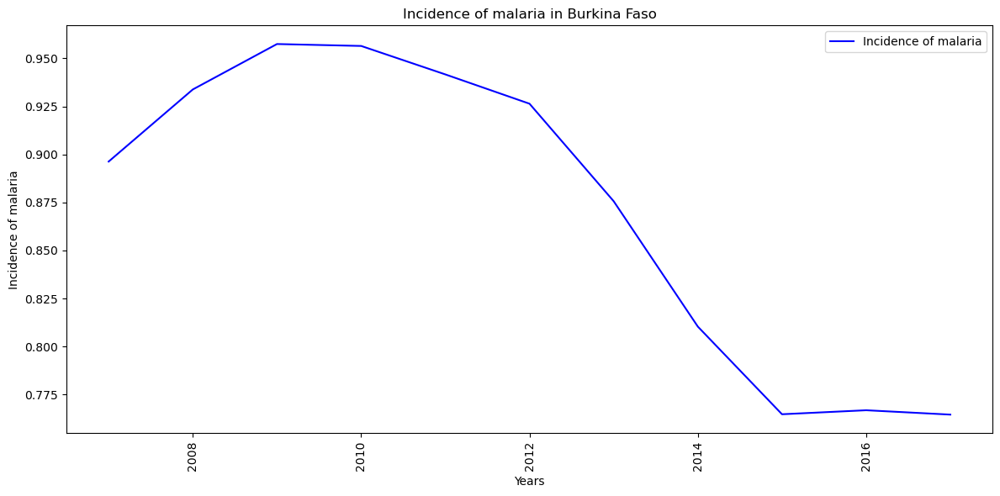

...

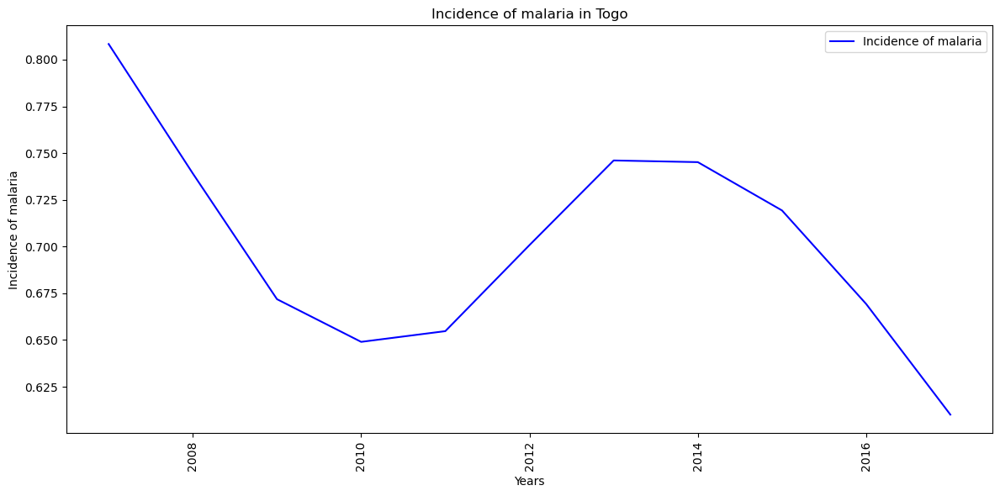

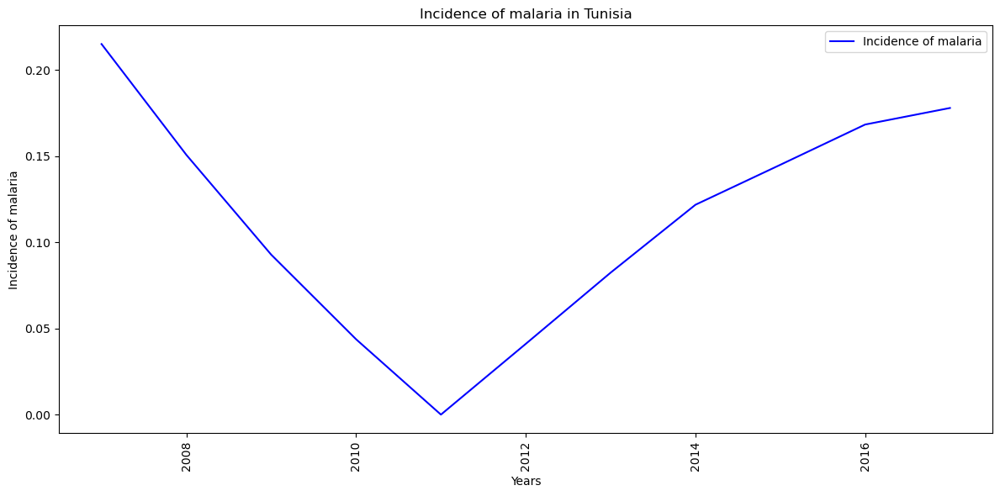

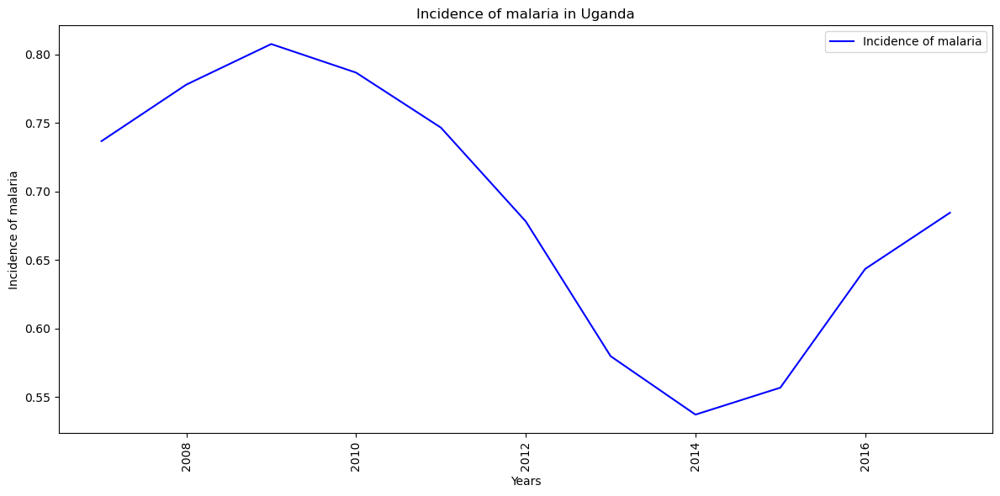

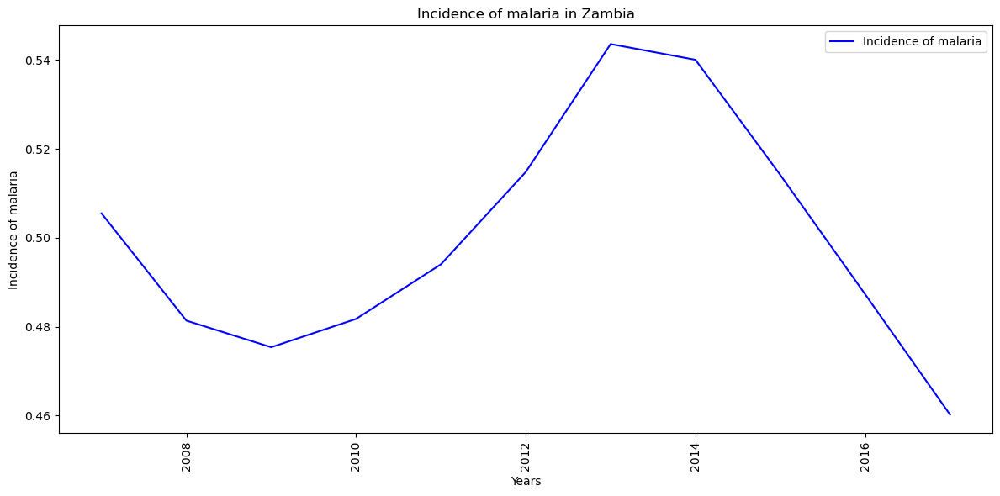

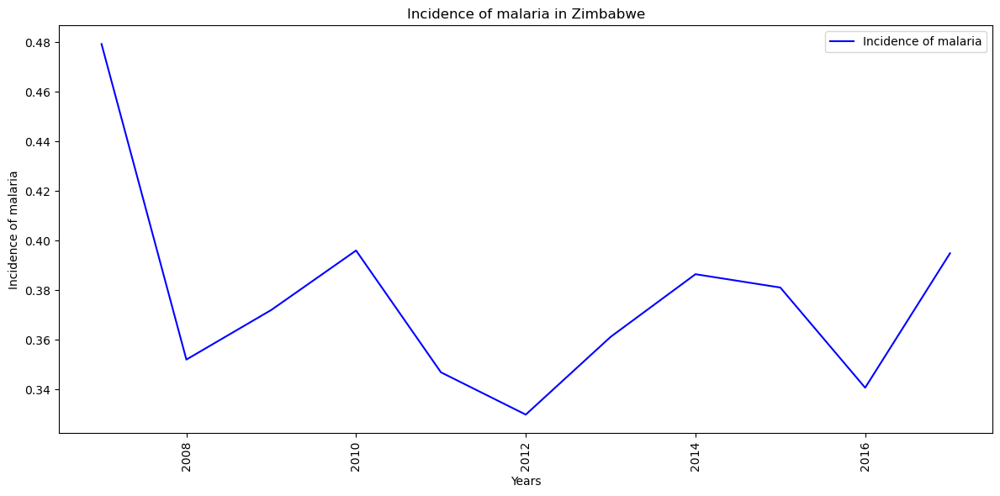

In [57]:
# Group the data by country and calculate the average incidence of malaria cases
average_incidence_by_country = df.groupby("Country Name")
for name, group in average_incidence_by_country:
    # Visualize the top countries with the highest incidence of malaria
    plt.figure(figsize=(12, 6))
    plt.plot(group["Year"].values, group["Incidence of malaria"].values, color='blue', label='Incidence of malaria')
    plt.xlabel('Years')
    plt.ylabel('Incidence of malaria')
    plt.title(f'Incidence of malaria in {name}')
    plt.legend()
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

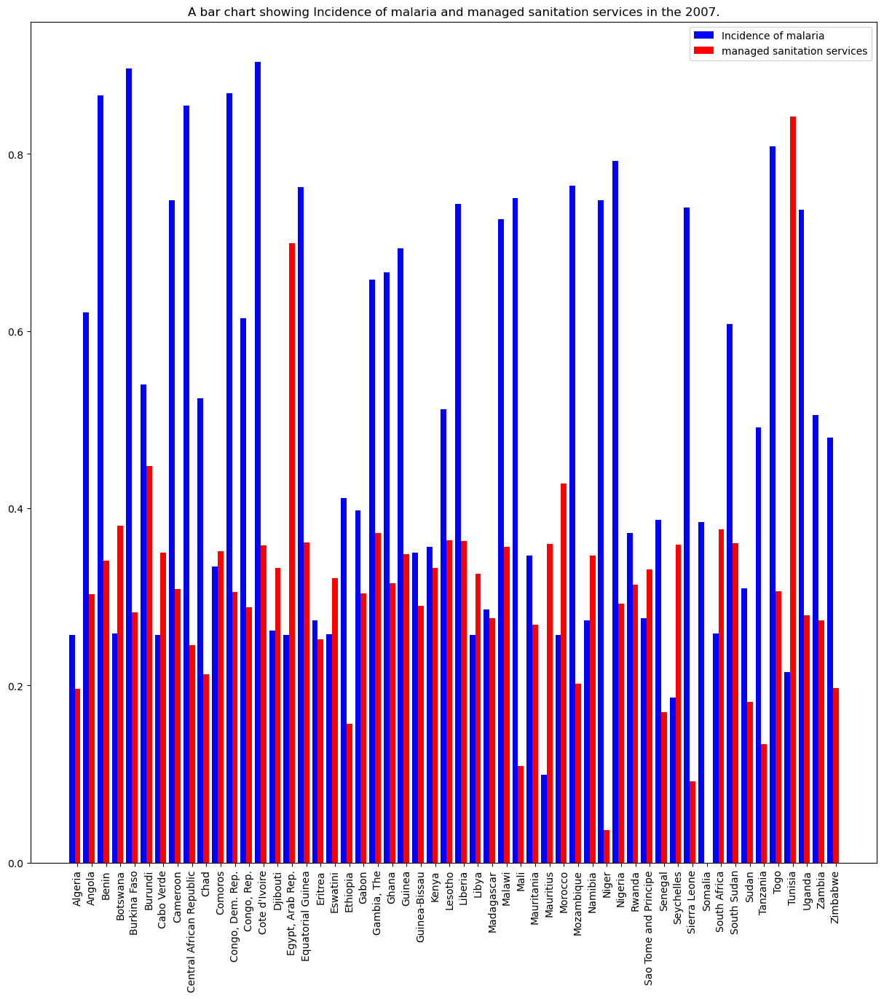

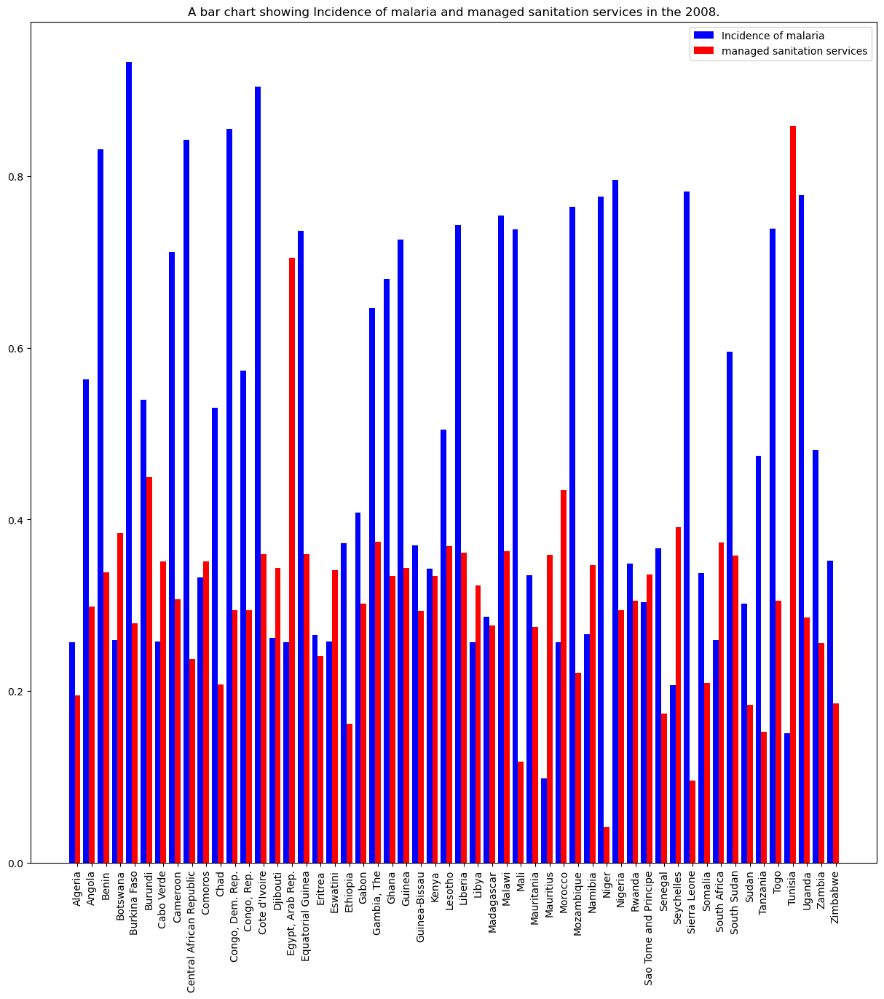

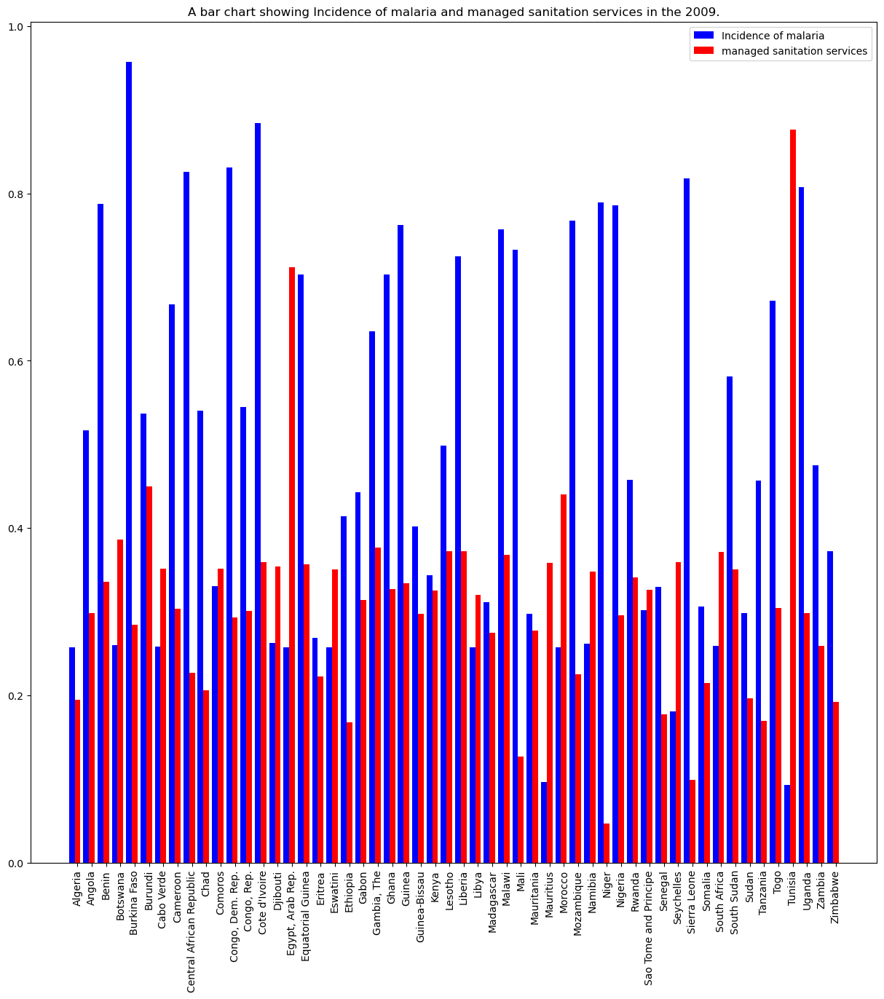

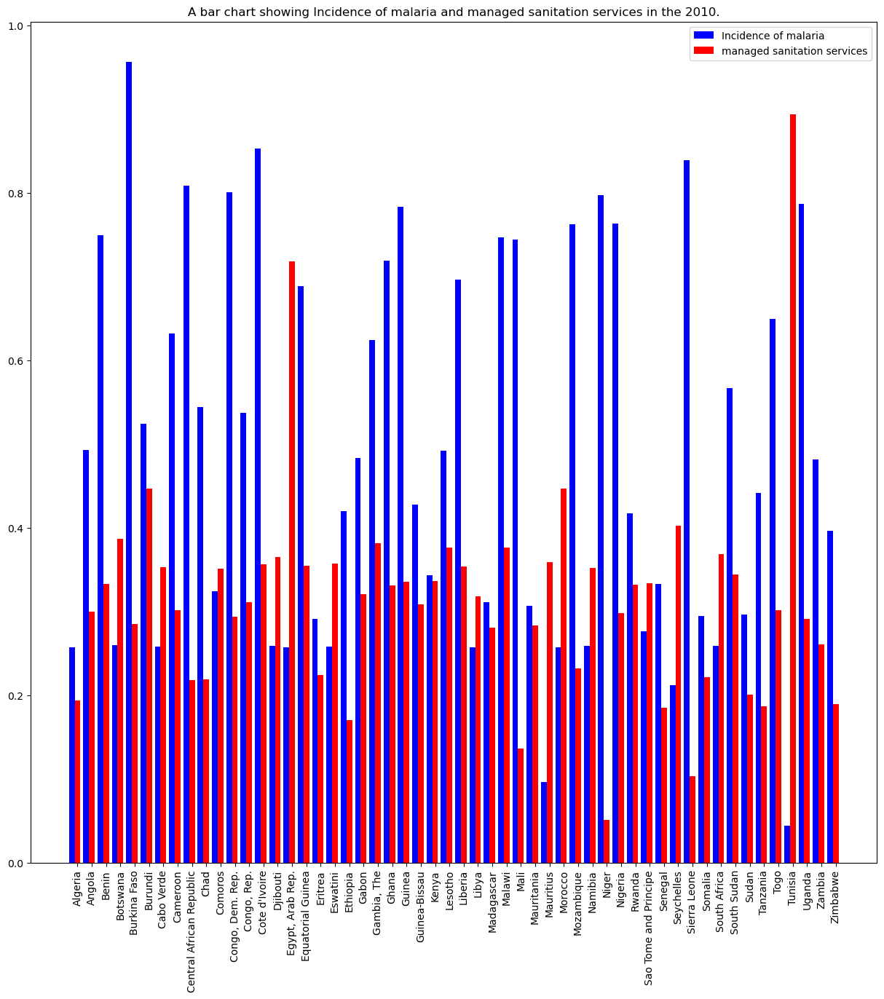

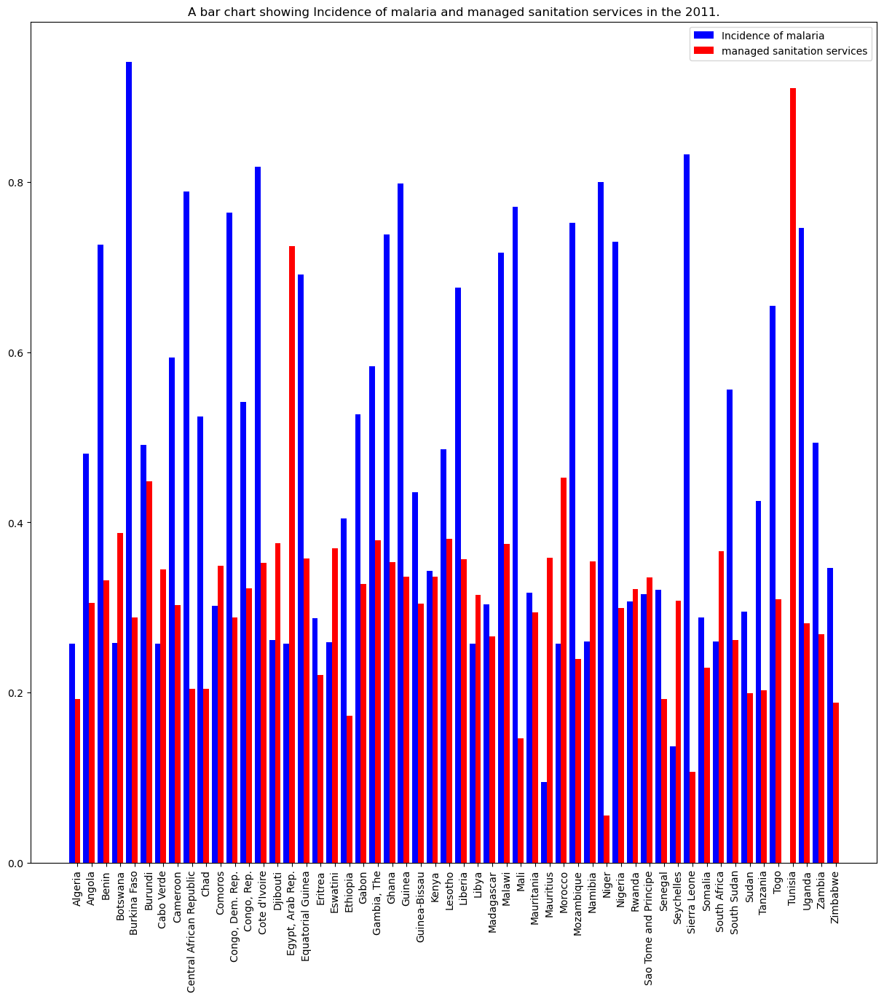

...

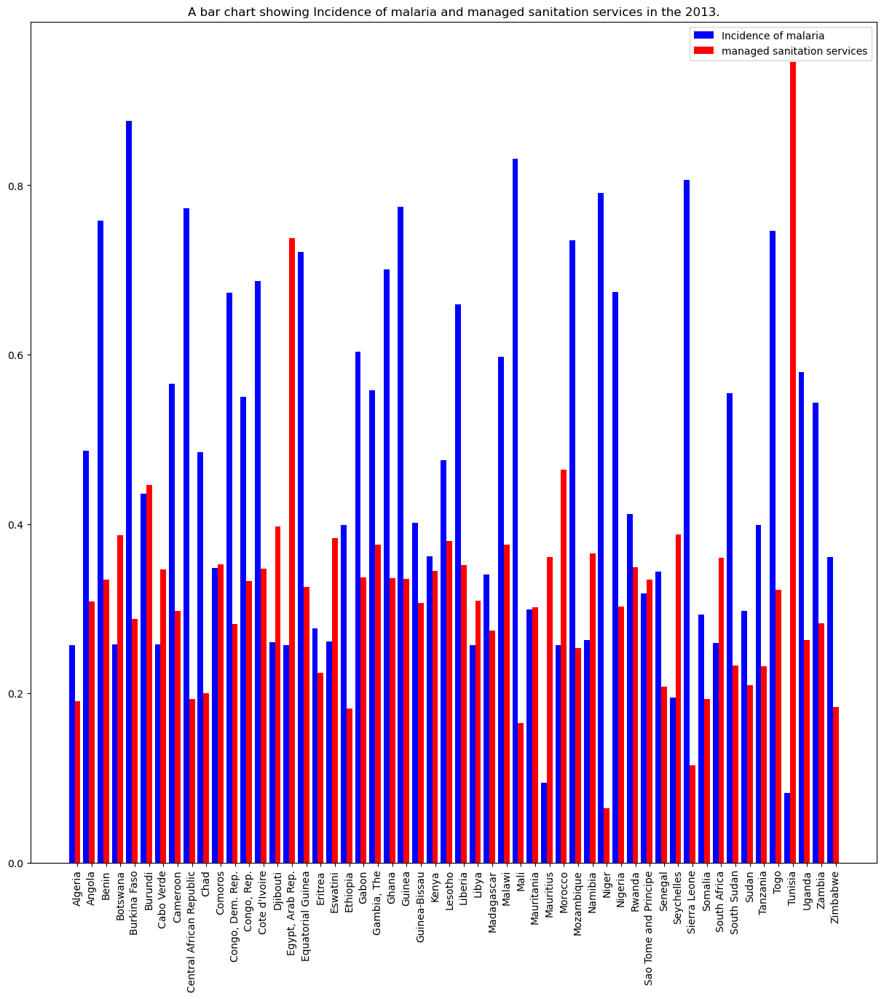

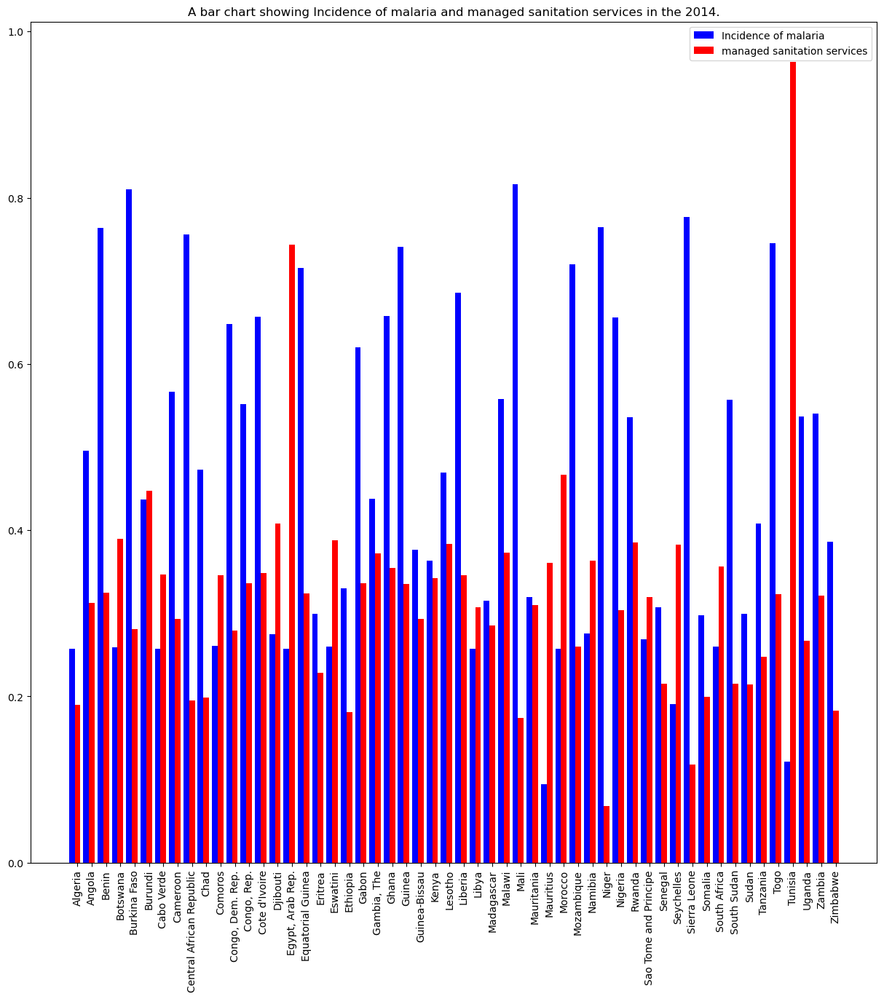

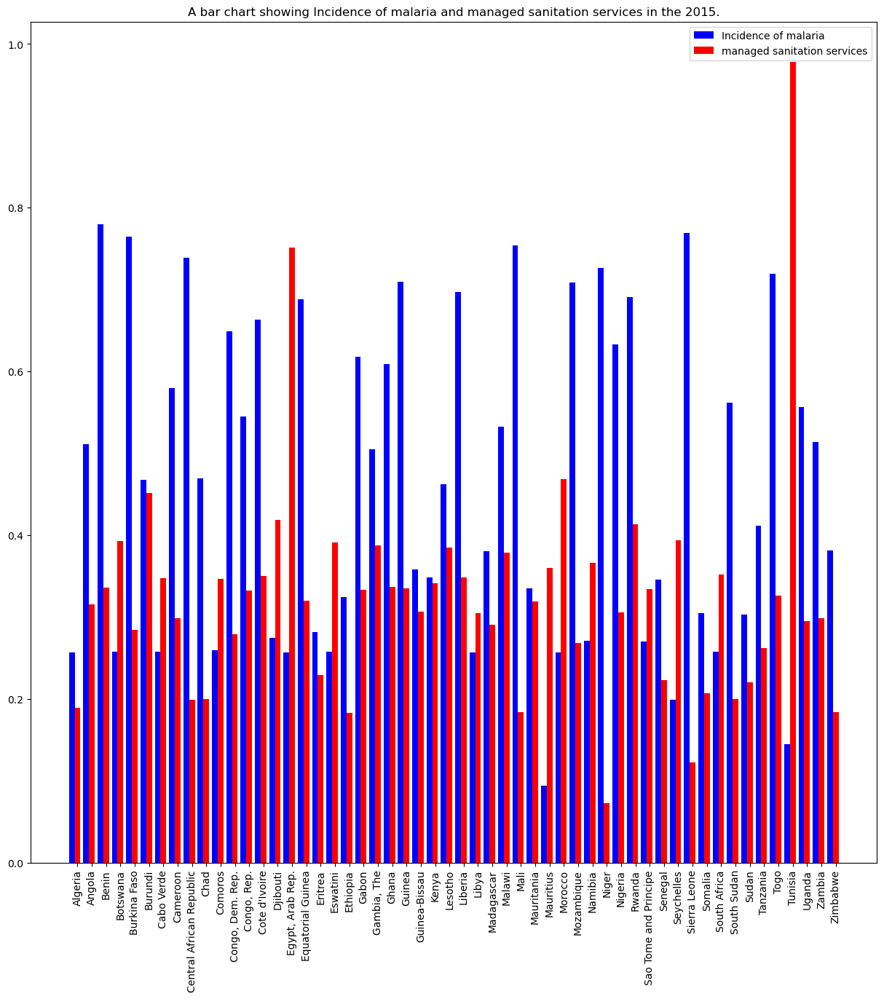

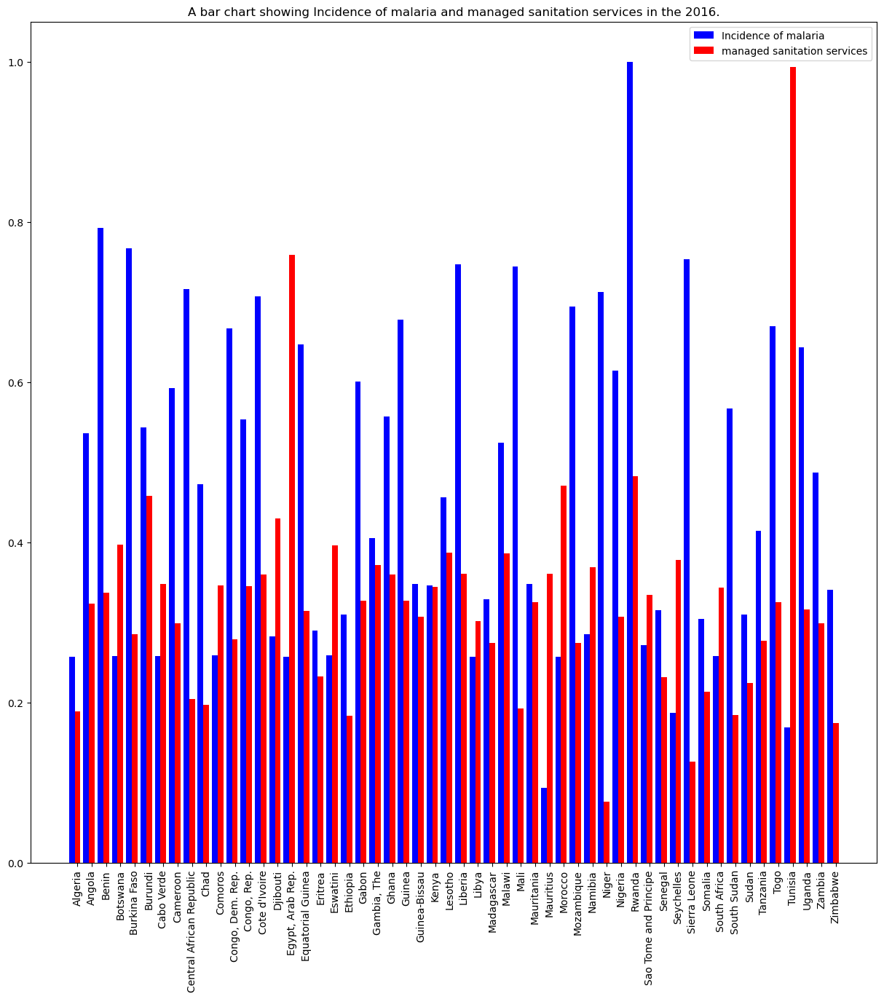

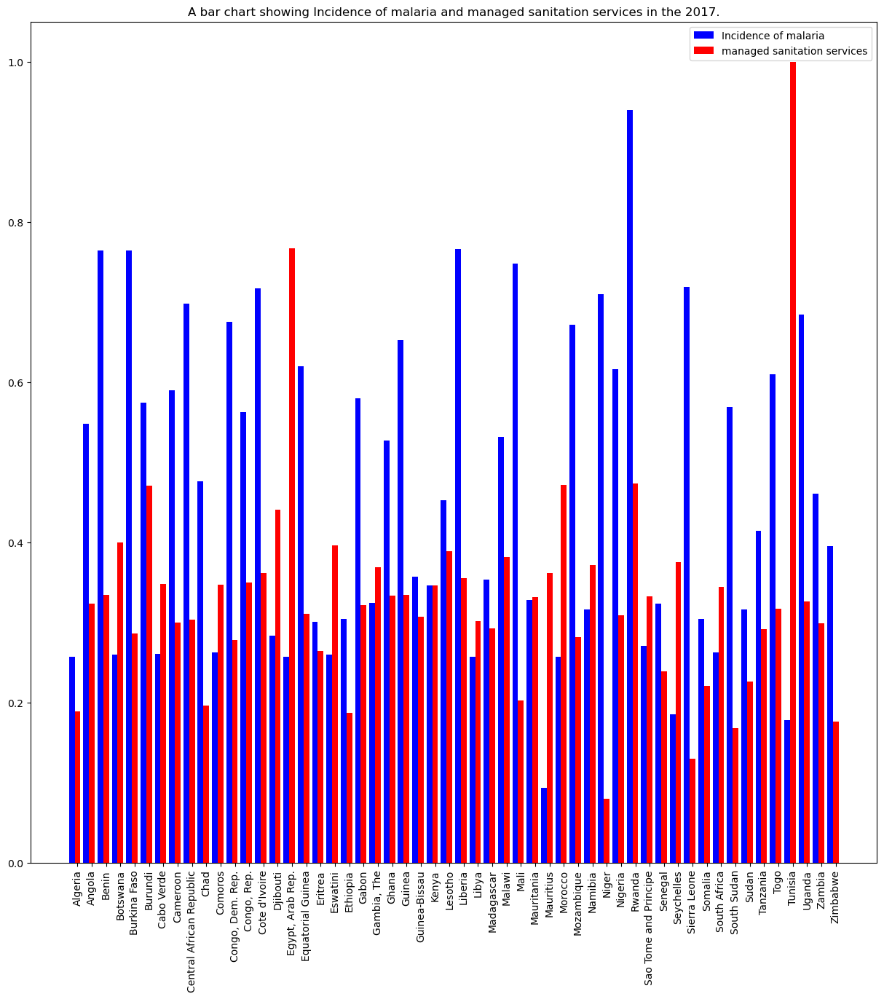

In [58]:
# Group the data by country and calculate the average incidence of malaria cases
average_incidence_by_country = df.groupby("Year")

for name, group in average_incidence_by_country:
    fig, ax = plt.subplots(1,1, figsize=(15,15))
    x = np.arange(len(group["Country Name"].values))
    w =0.4
    ax.bar(x-w, group["Incidence of malaria"], width=w, color='b', label='Incidence of malaria', align='center')
    ax.bar(x, group["managed sanitation services"], width=w, color='r', label='managed sanitation services',align='center')
    ax.set_xticks(np.arange(len(group["Country Name"].values)))
    ax.set_xticklabels(list(group["Country Name"].values))
    plt.xticks(rotation='vertical')
    plt.legend()
    plt.title(f"A bar chart showing Incidence of malaria and managed sanitation services in the {name}.")
    plt.show()

# conclusion


With most countries in Africa, incidences of malaria increases as the years increase with an exception of Central African
Republic,Equqtorial Guinea,Ghana, Togo and Zambia where the incidences reduce and Egypt where the incidences of malaria remain constant

There is no correlation between incidence of malaria and managed sanitation services

In [59]:
df[["Incidence of malaria", "managed sanitation services"]].corr()

,Incidence of malaria,managed sanitation services
Incidence of malaria,1.000000,-0.331567
managed sanitation services,-0.331567,1.000000


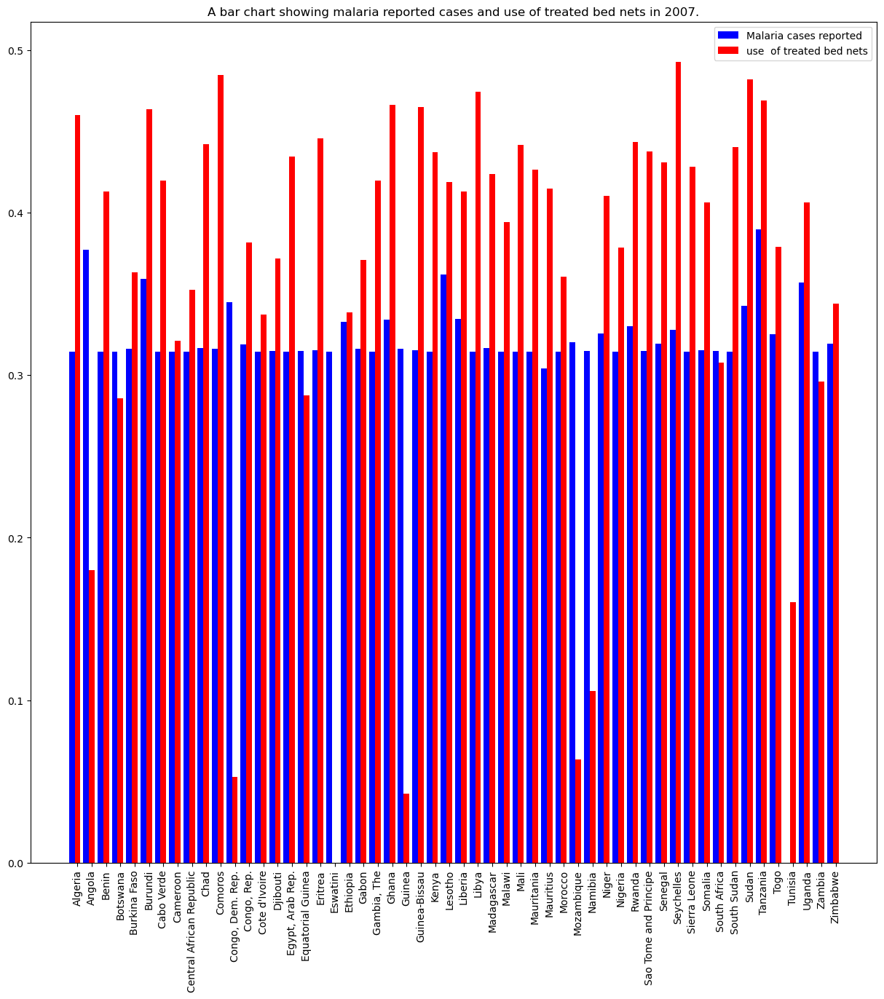

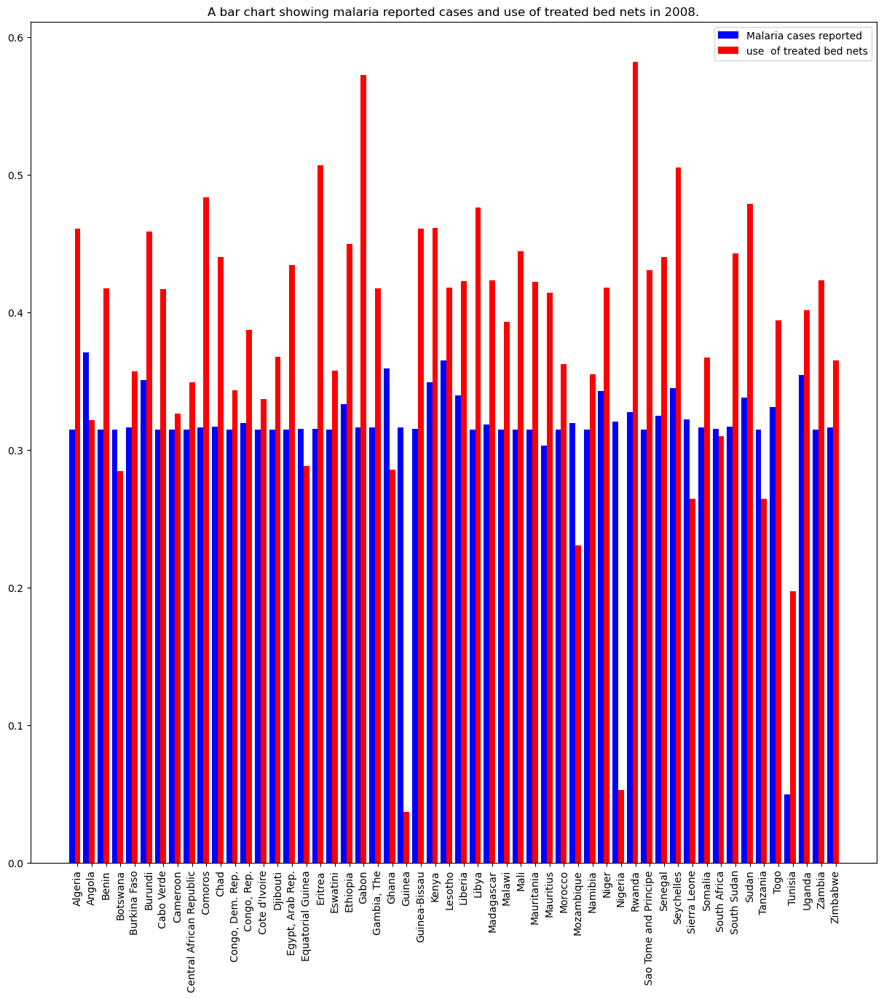

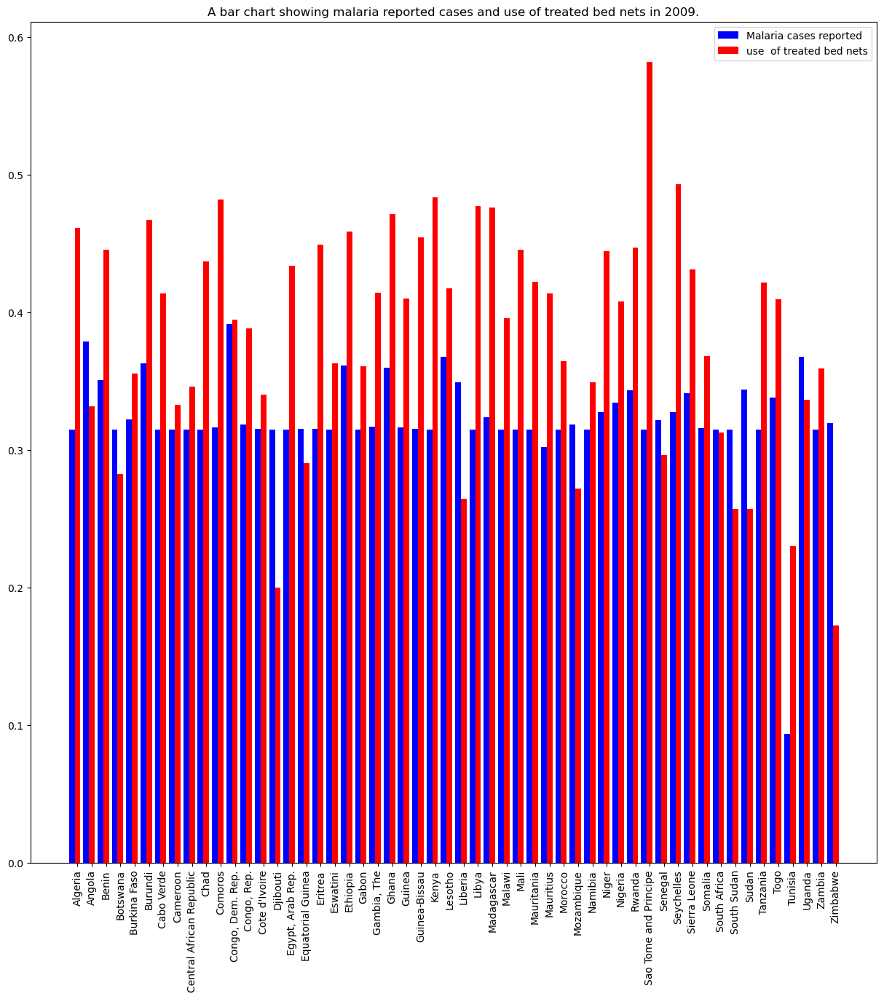

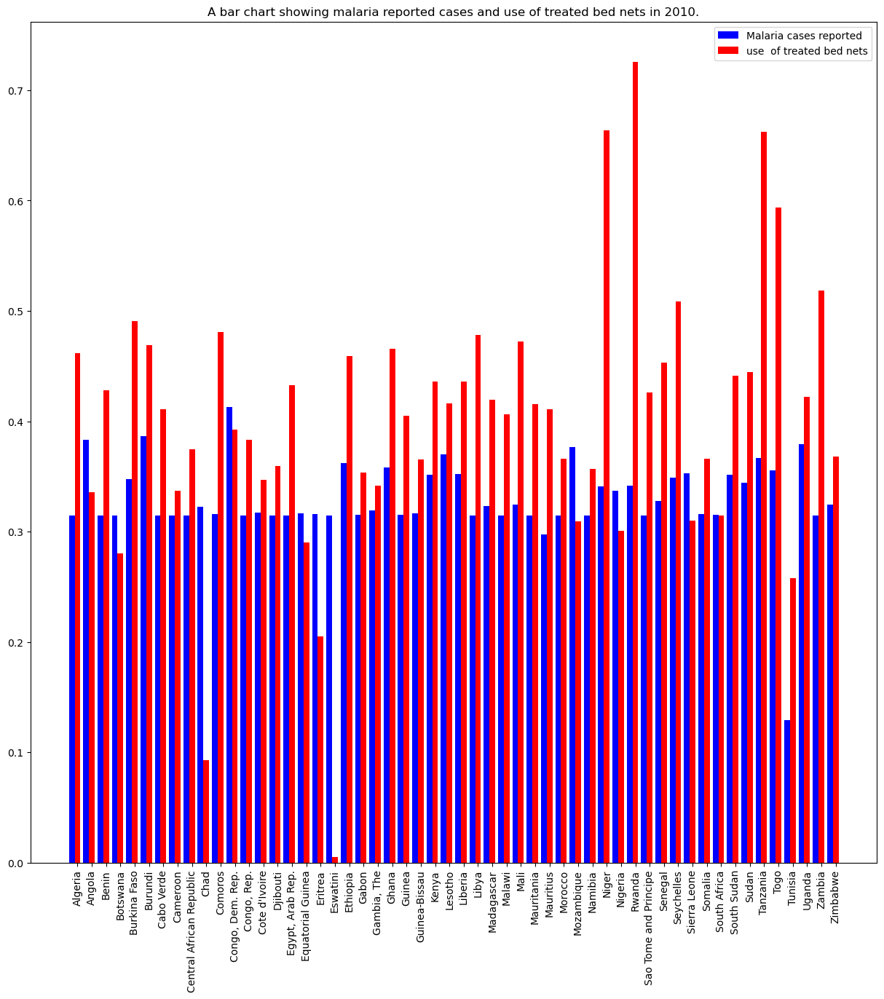

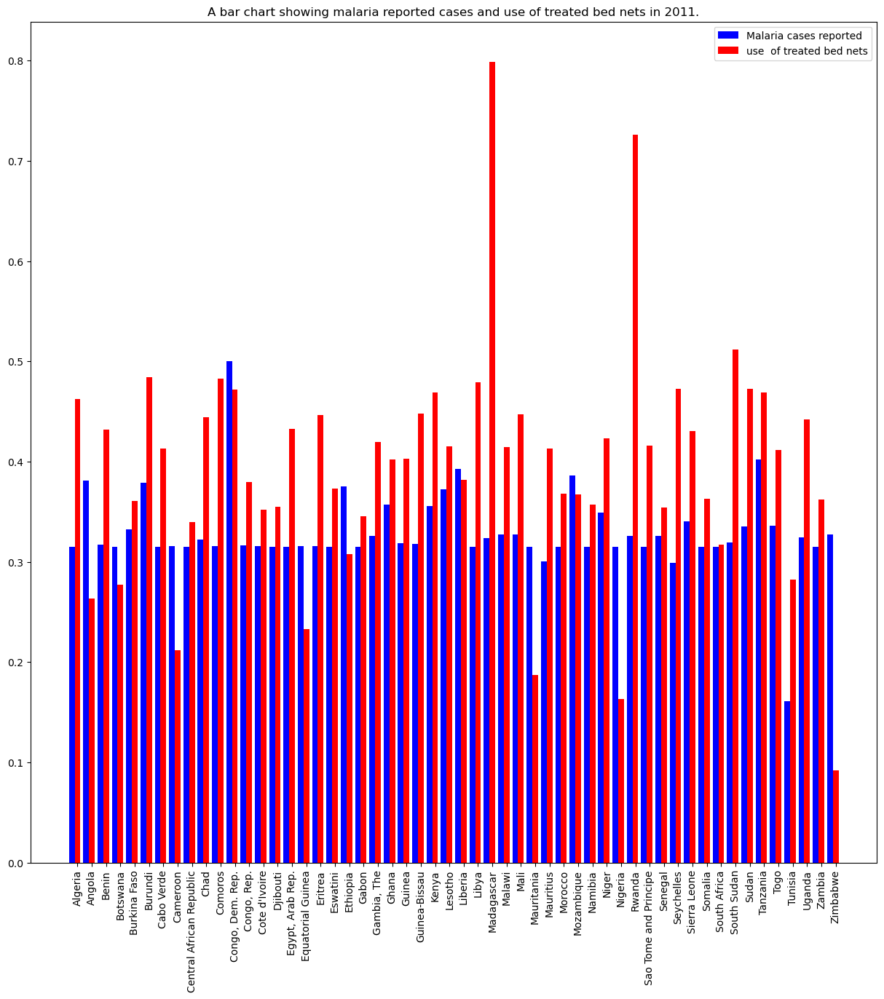

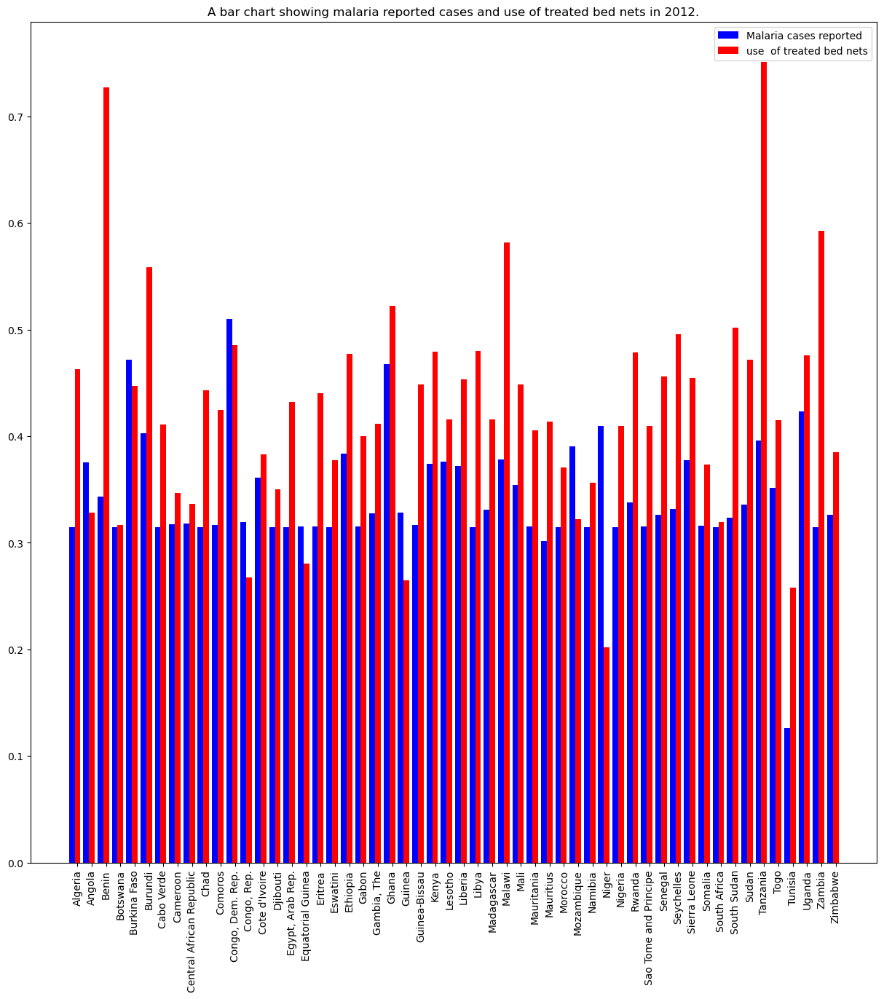

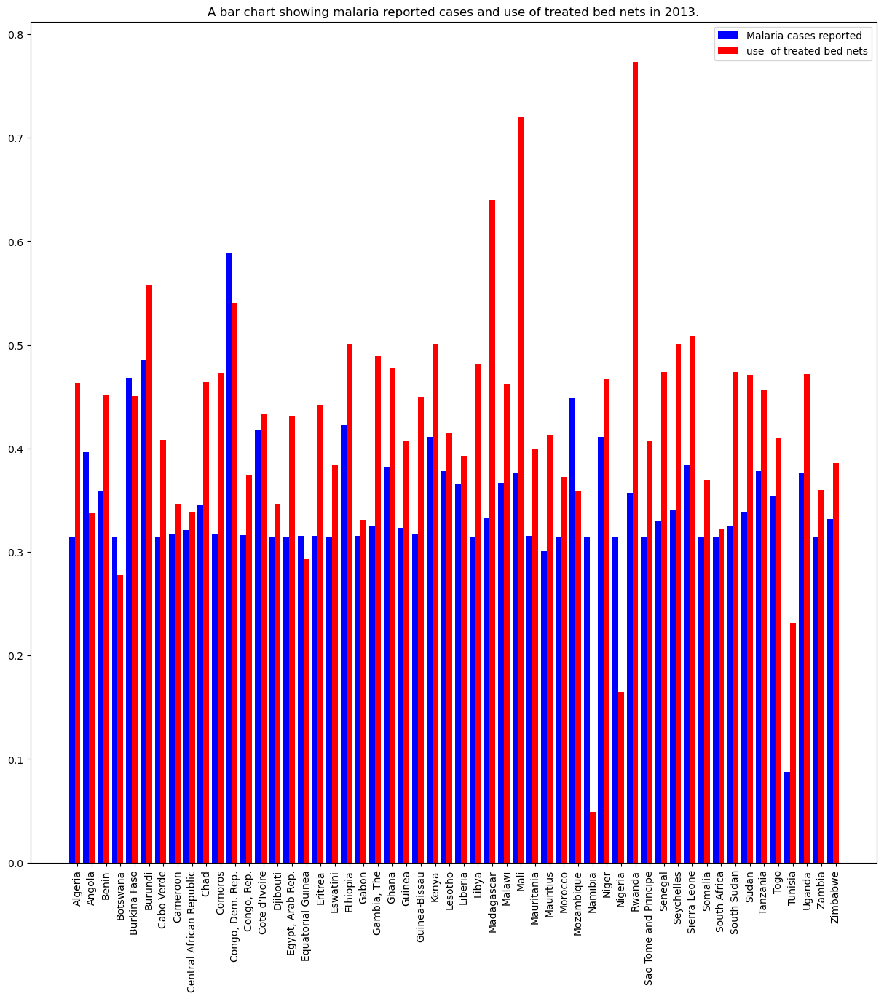

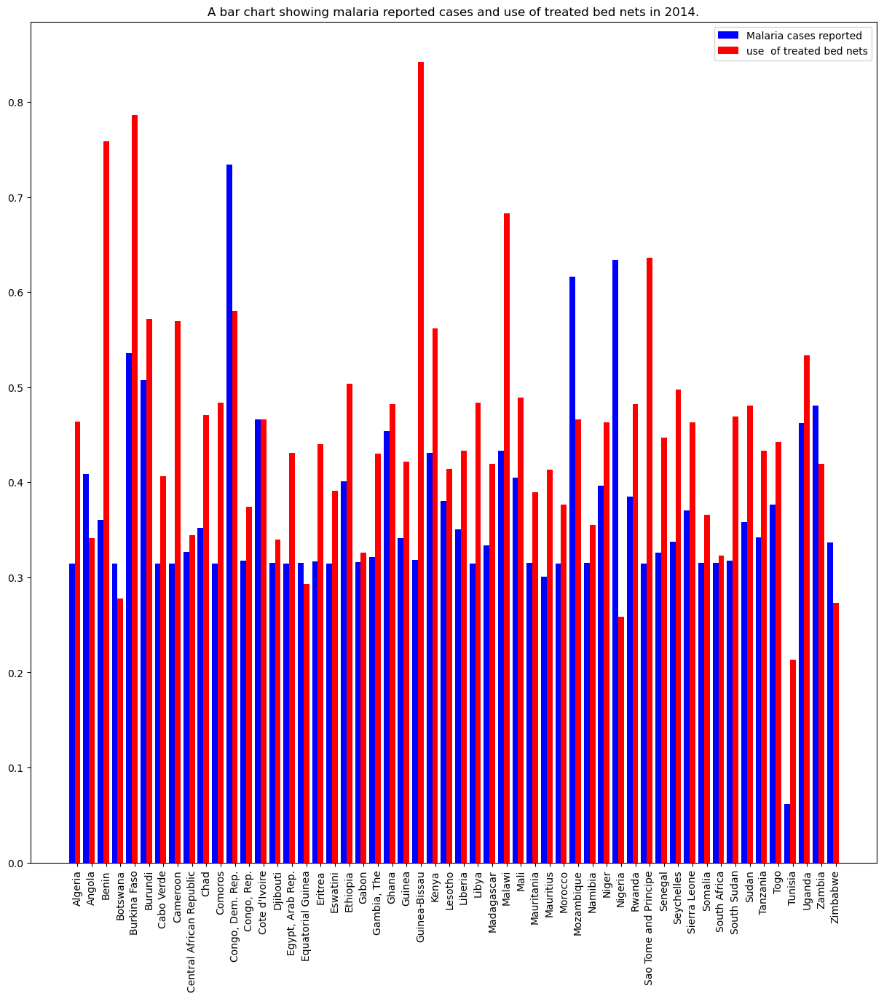

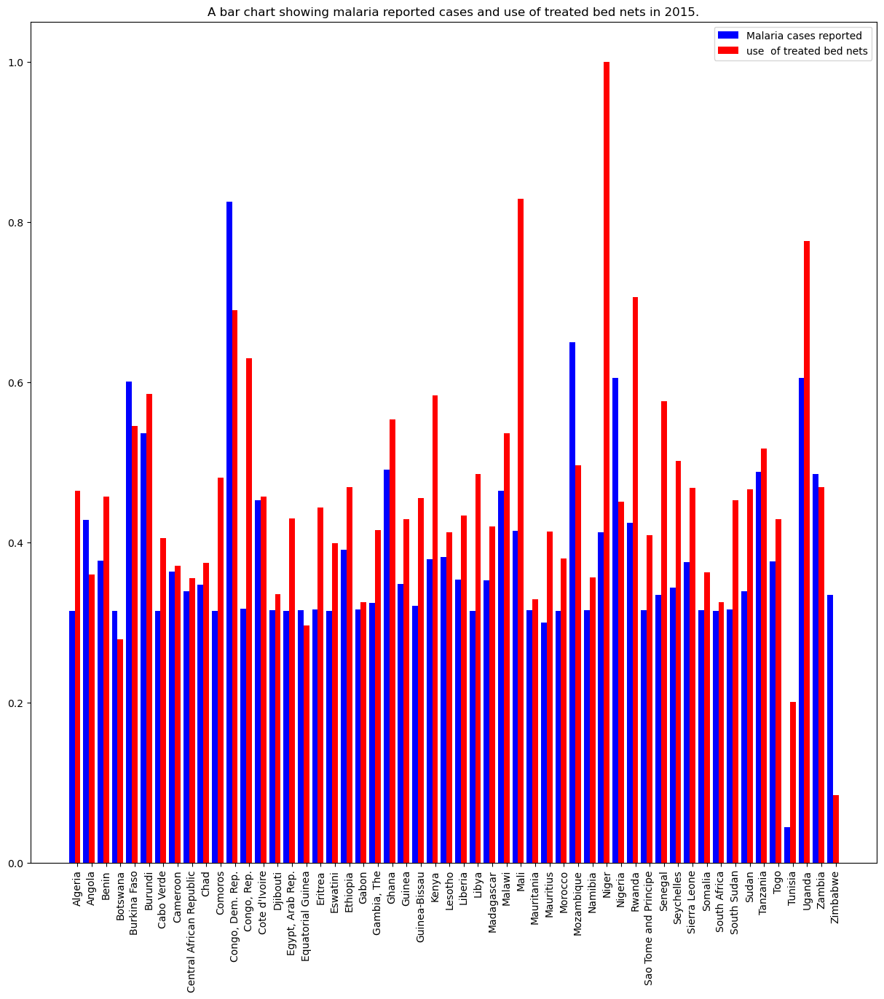

KeyboardInterrupt: 

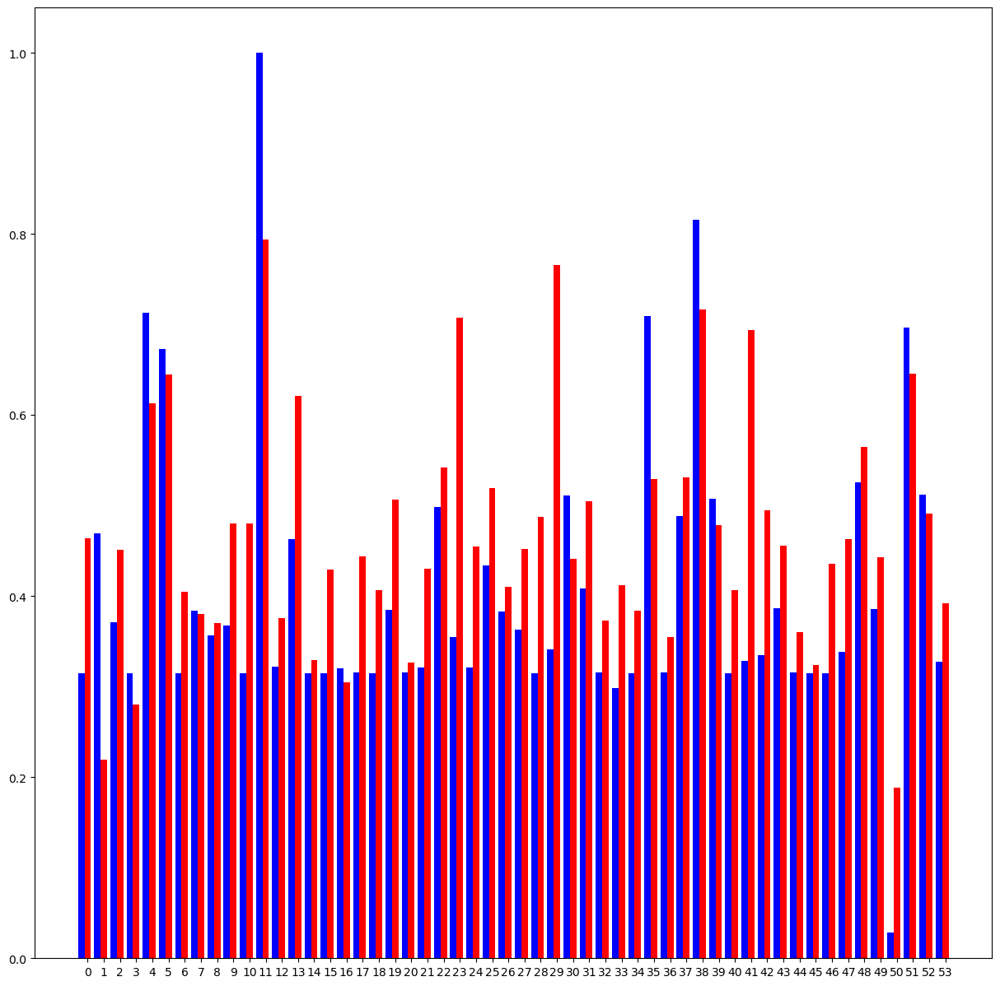

In [60]:
# NAGABA BLESSING 21/U/05218/PS 
# trends per Year 
# using a bar plot groupby year and see the effect of use of bed nets

average_incidence_by_country = df.groupby("Year")

for name, group in average_incidence_by_country:
    fig, ax = plt.subplots(1,1, figsize=(15,15))
    x = np.arange(len(group["Country Name"].values))
    w =0.4
    ax.bar(x-w, group["Malaria cases reported"], width=w, color='b', label='Malaria cases reported', align='center')
    ax.bar(x, group["insecticide-treated bed nets"], width=w, color='r', label='use  of treated bed nets',align='center')
    ax.set_xticks(np.arange(len(group["Country Name"].values)))
    ax.set_xticklabels(list(group["Country Name"].values))
    plt.xticks(rotation='vertical')
    plt.legend()
    plt.title(f"A bar chart showing malaria reported cases and use of treated bed nets in {name}.")
    plt.show()
 

In [ ]:
# get the correlation 
correlation = df['insecticide-treated bed nets'].corr(df['Malaria cases reported'])
print(f"Correlation coefficient: {correlation}")


Correlation coefficient: 0.4714577542948476


### predict malaria cases reported using the column of people using safely managed sanitation services

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix



# Separate features (X) and target variable (y)
X = df[['managed sanitation services']]  
Y = df['Malaria cases reported']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Initialize the Random Forest Classifier
model = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model on the training data
model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = model.score(X_test, y_test)
print("Accuracy:", accuracy)

Accuracy: 0.08059993321787806


In [ ]:
# assume a value of 76 for managed sanitation services, predict its value for malaria cases

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score



# managed sanitation services" is the input feature and "malaria cases" is the target variable
X = df["managed sanitation services"].values.reshape(-1, 1)
y = df["Malaria cases reported"]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model using Random Forest Regressor
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Predict the value for "malaria cases" given "use_of_bed_nets = 76"
predicted_malaria_cases = model.predict([[76]])

print("Predicted Malaria Cases:", predicted_malaria_cases[0])


Predicted Malaria Cases: 0.03910974071800985


In [ ]:
#NAMULI SYLVIA 21/U/12848/PS
#OBJECTIVE:HOW POPULATION GROWTH AFFECTS INCIDENCE OF MALARIA IN DIFFERENT AFRICA
# Group the data by country and calculate the average incidence of malaria cases


import pandas as pd


# Create a new column 'Population Annual Growth'
df['Population annual growth'] = 0
""""
The population annual growth is simply the average of urban population growth and rural population growth
We used the average because our dataframe is cleaned and has been normalised
"""    
df['Population annual growth'] = (df['Rural population growth'] + df['urban population growth']) / 2
df


,Country Name,Year,Country Code,geometry,latitude,longitude,Incidence of malaria,Malaria cases reported,insecticide-treated bed nets,Children with fever receiving antimalarial drugs,...,Rural population growth,Urban population,urban population growth,basic drinking water services,basic drinking water services rural,basic drinking water services urban,basic sanitation services,basic sanitation services rural,basic sanitation services urban,Population annual growth
0,Algeria,2007,DZA,POINT (28.033886 1.659626),28.033886,1.659626,0.257181,0.314625,0.460139,0.125561,...,0.270398,0.701340,0.610788,0.884501,0.830877,0.892716,0.851068,0.648694,0.909823,0.440593
1,Angola,2007,AGO,POINT (-11.202692 17.873887),-11.202692,17.873887,0.620909,0.377105,0.179894,0.498011,...,0.508539,0.602376,0.801660,0.267945,0.081179,0.288458,0.339648,0.104673,0.488334,0.655099
2,Benin,2007,BEN,POINT (9.307689999999999 2.315834),9.307690,2.315834,0.866414,0.314624,0.412996,0.730678,...,0.516129,0.400657,0.725311,0.491045,0.457478,0.505740,0.071677,0.020744,0.114092,0.620720
3,Botswana,2007,BWA,POINT (-22.328474 24.684866),-22.328474,24.684866,0.258475,0.314640,0.285913,0.166698,...,0.190702,0.607558,0.784232,0.704132,0.489853,0.883740,0.595832,0.329317,0.755016,0.487467
4,Burkina Faso,2007,BFA,POINT (12.238333 -1.561593),12.238333,-1.561593,0.896302,0.316427,0.363303,0.677533,...,0.532258,0.166077,0.876349,0.328727,0.339212,0.503861,0.111672,0.038809,0.395590,0.704303
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
589,Togo,2017,TGO,POINT (8.619543 0.824782),8.619543,0.824782,0.610100,0.386155,0.726984,0.511866,...,0.477230,0.395602,0.700415,0.510083,0.378594,0.773325,0.117251,0.047626,0.187004,0.588822
590,Tunisia,2017,TUN,POINT (33.886917 9.537499),33.886917,9.537499,0.177941,0.019156,0.181025,0.025846,...,0.346300,0.742922,0.516183,0.948949,0.865668,0.995408,0.904431,0.686812,0.964886,0.431241
591,Uganda,2017,UGA,POINT (1.373333 32.290275),1.373333,32.290275,0.684391,0.790029,0.707984,0.799068,...,0.612903,0.168605,0.904564,0.284022,0.292341,0.482154,0.141880,0.123429,0.157839,0.758734
592,Zambia,2017,ZMB,POINT (-13.133897 27.849332),-13.133897,27.849332,0.460212,0.538951,0.512294,0.524498,...,0.518027,0.418605,0.735270,0.437174,0.300797,0.664788,0.225029,0.147285,0.276015,0.626648


In [ ]:
df.columns

Index(['Country Name', 'Year', 'Country Code', 'geometry', 'latitude',
       'longitude', 'Incidence of malaria', 'Malaria cases reported',
       'insecticide-treated bed nets',
       'Children with fever receiving antimalarial drugs', 'IPT',
       'drinking water services', 'drinking water services rural',
       'drinking water services urban', 'managed sanitation services',
       'sanitation services rural', 'sanitation services urban',
       'Rural population', 'Rural population growth', 'Urban population',
       'urban population growth', 'basic drinking water services',
       'basic drinking water services rural',
       'basic drinking water services urban', 'basic sanitation services',
       'basic sanitation services rural', 'basic sanitation services urban',
       'Population annual growth'],
      dtype='object')

In [ ]:
# List the columns to be used for the objective
desired_columns = ['Country Name', 'Year', 'Incidence of malaria', 'Malaria cases reported', 'Population annual growth'] 
# Create a new DataFrame with only the desired columns
df1 = df[desired_columns]
df1

,Country Name,Year,Incidence of malaria,Malaria cases reported,Population annual growth
0,Algeria,2007,0.257181,0.314625,0.440593
1,Angola,2007,0.620909,0.377105,0.655099
2,Benin,2007,0.866414,0.314624,0.620720
3,Botswana,2007,0.258475,0.314640,0.487467
4,Burkina Faso,2007,0.896302,0.316427,0.704303
...,...,...,...,...,...
589,Togo,2017,0.610100,0.386155,0.588822
590,Tunisia,2017,0.177941,0.019156,0.431241
591,Uganda,2017,0.684391,0.790029,0.758734
592,Zambia,2017,0.460212,0.538951,0.626648


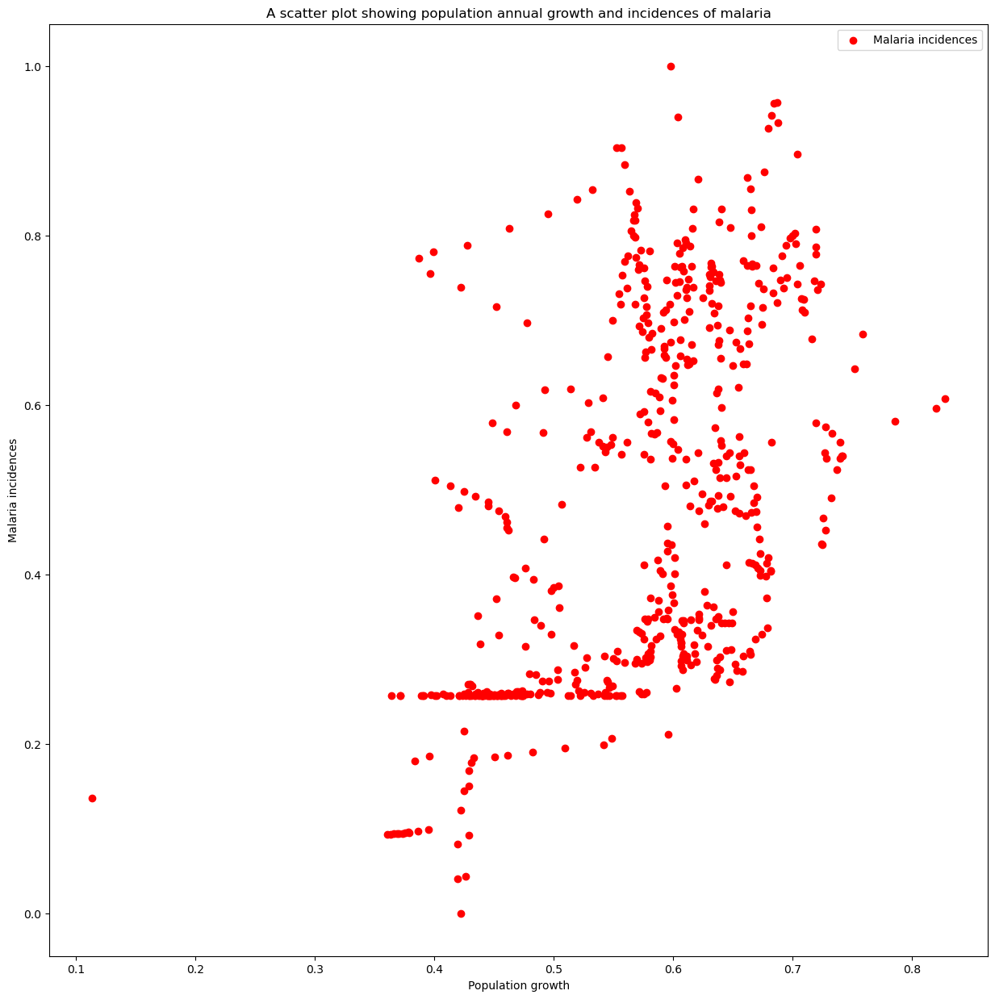

In [ ]:
#Visualisation
#Illustrating scatter plot

fig, ax = plt.subplots(1,1, figsize=(15,15))
ax.scatter(df["Population annual growth"].values,df["Incidence of malaria"].values, color='r', label='Malaria incidences')
plt.legend()
plt.title(f"A scatter plot showing population annual growth and incidences of malaria")
plt.xlabel("Population growth")
plt.ylabel("Malaria incidences")
plt.show()

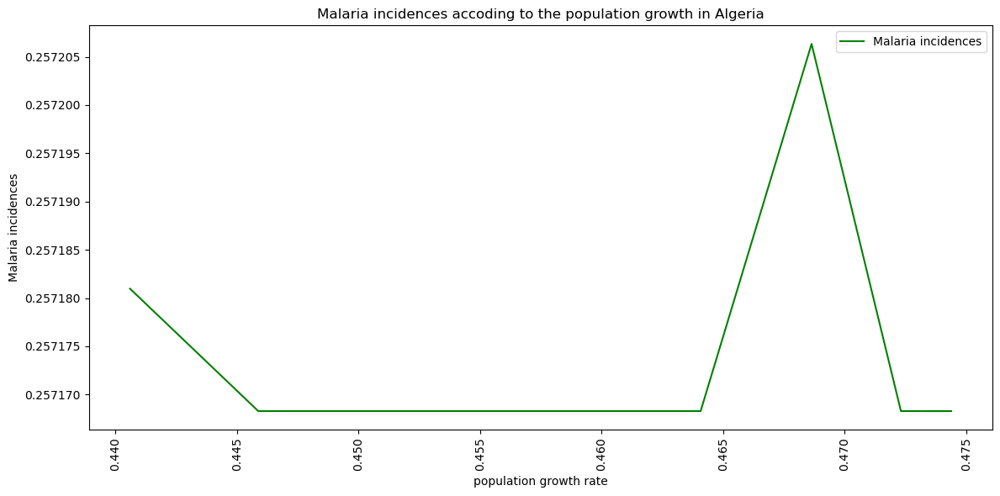

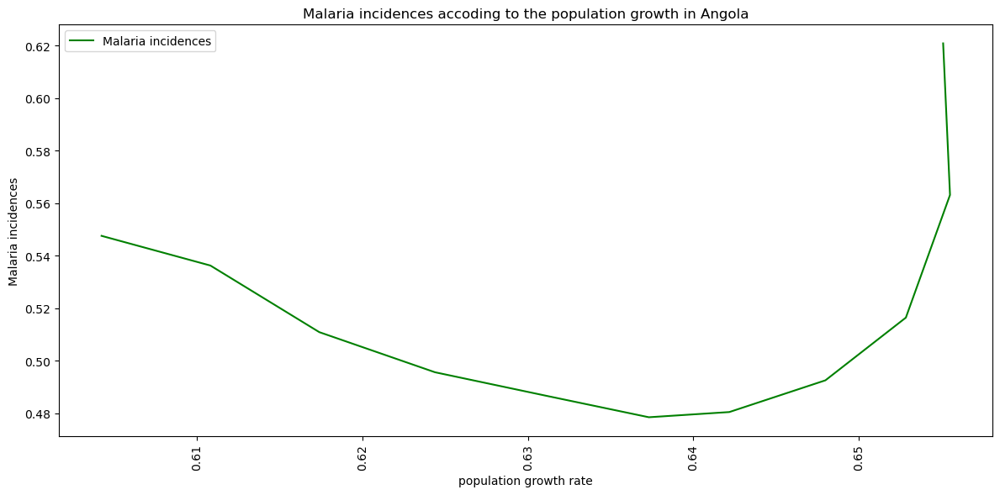

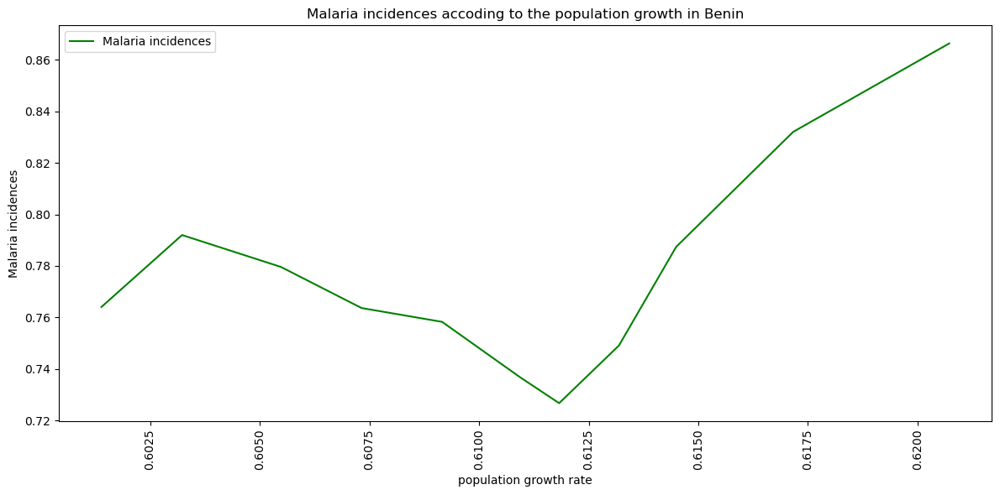

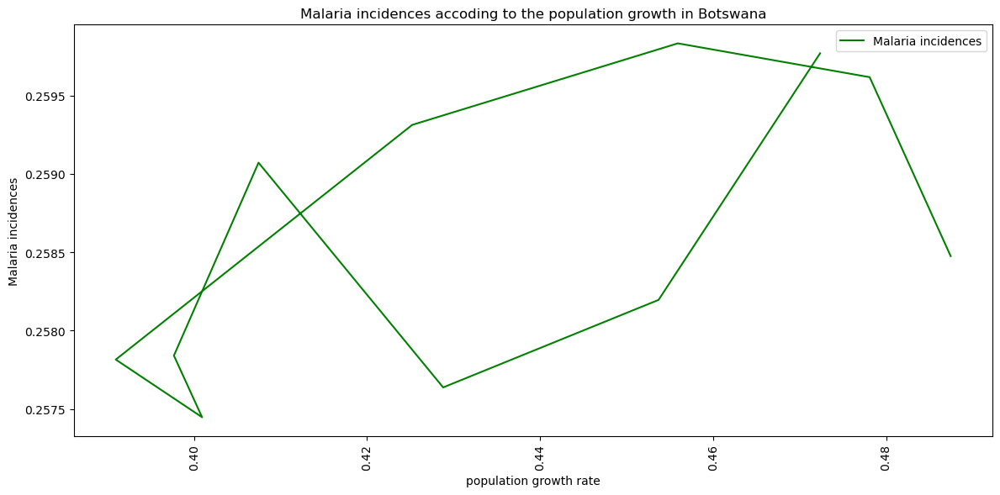

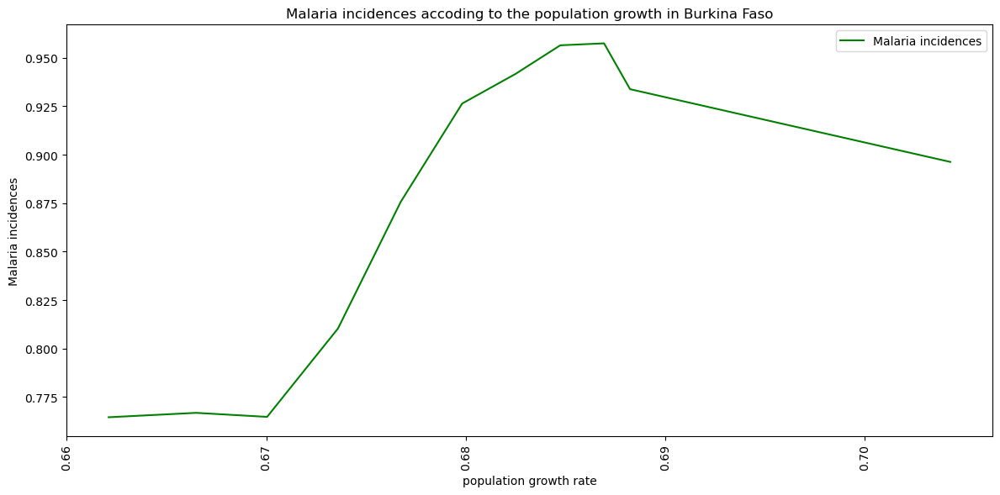

...

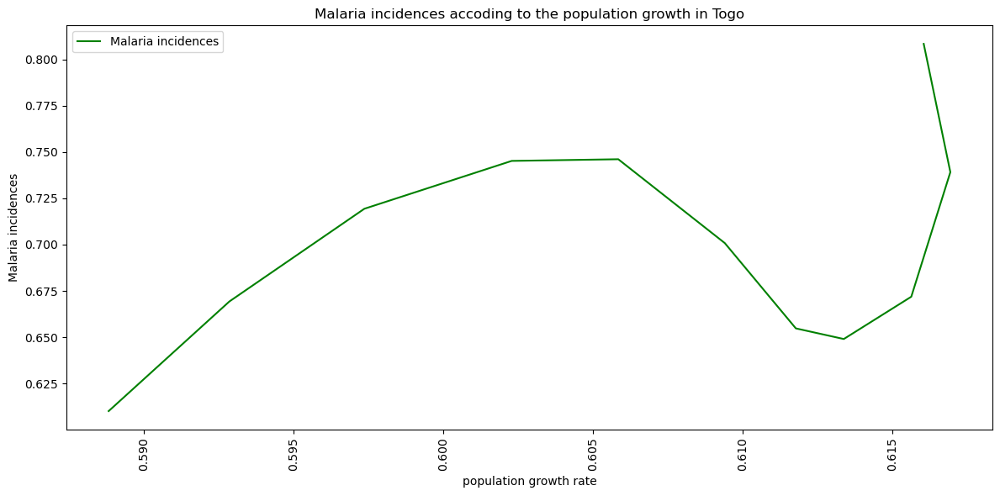

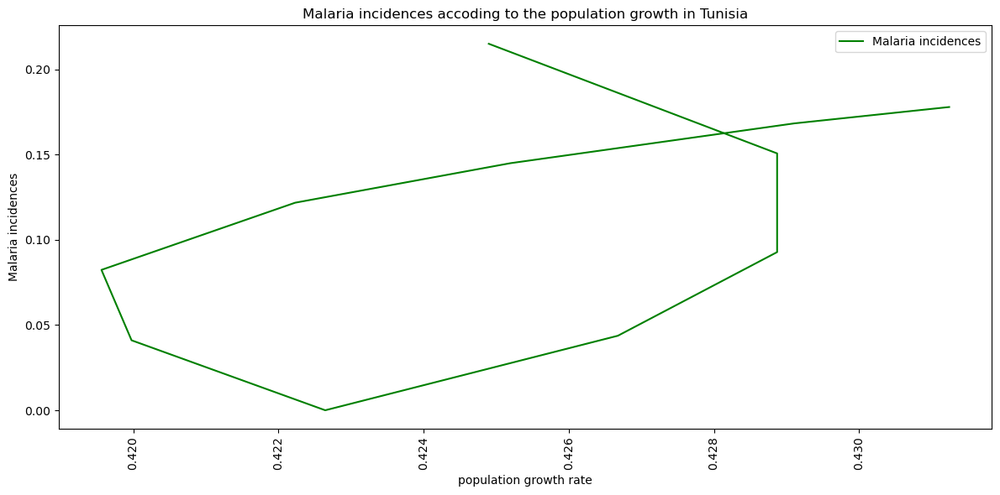

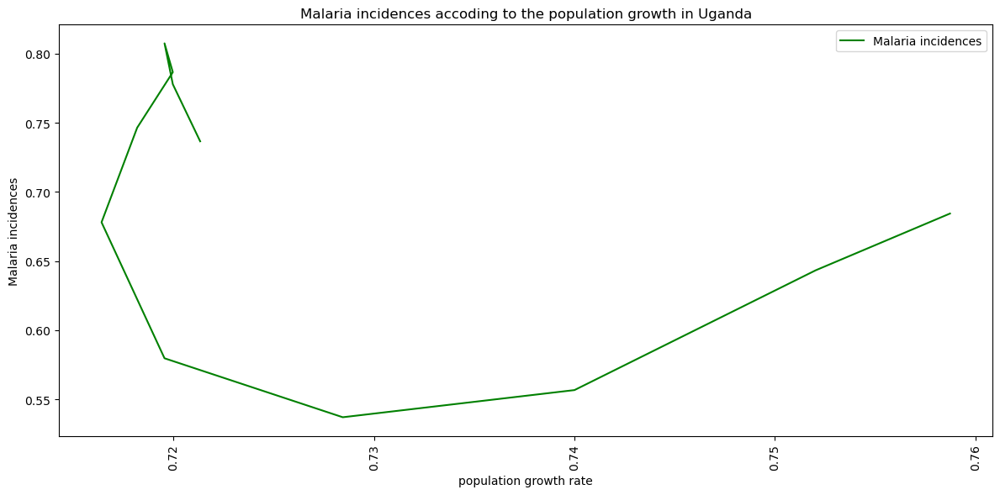

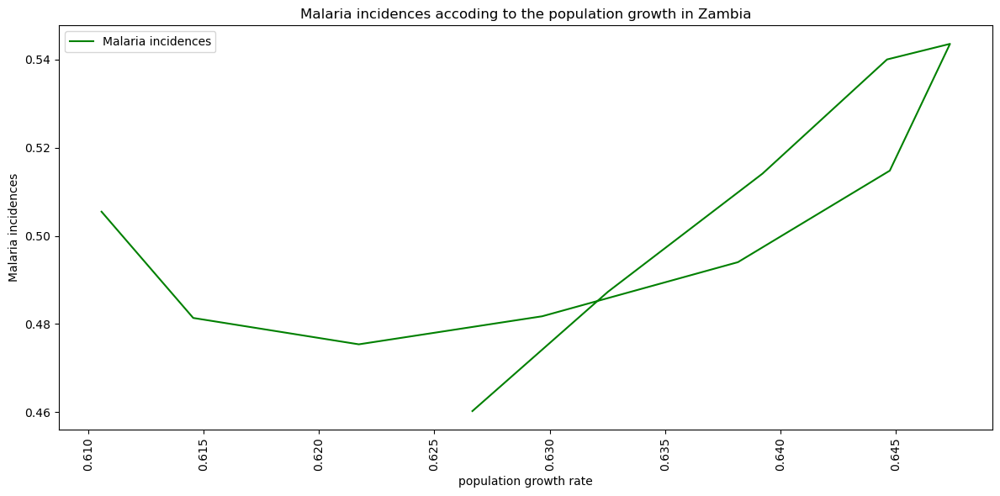

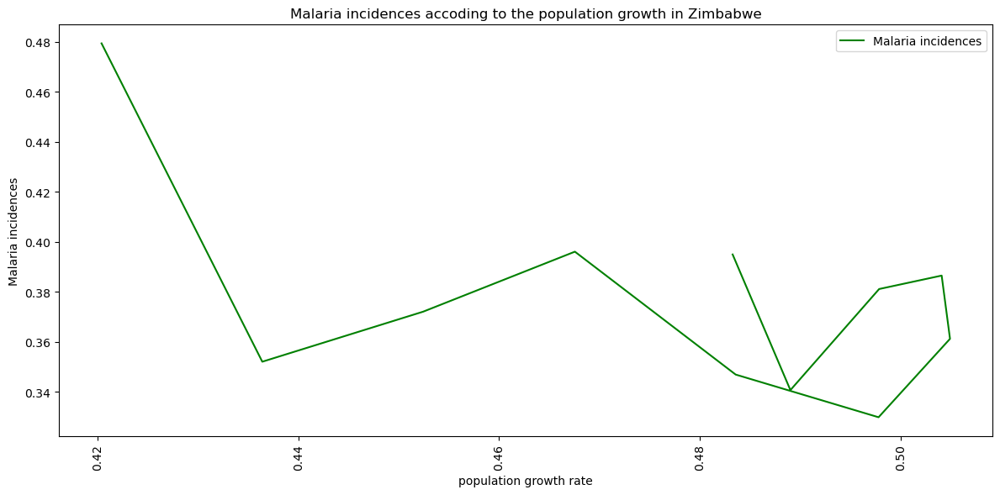

In [ ]:
# Group the data by country and calculate the average incidence of malaria cases
average_incidence_by_country = df.groupby("Country Name")
for name, group in average_incidence_by_country:
    # Visualize the top countries with the highest average incidence and their corresponding number of malaria cases
    plt.figure(figsize=(12, 6))
    plt.plot(group["Population annual growth"].values, group["Incidence of malaria"].values, color='green', label='Malaria incidences')
    plt.xlabel('population growth rate')
    plt.ylabel('Malaria incidences')
    plt.title(f'Malaria incidences accoding to the population growth in {name}')
    plt.legend()
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

In [ ]:
#checked for the correlation between Incidence of malaria and population annual growth
import pandas as pd
correlation = df1['Population annual growth'].corr(df1['Incidence of malaria'])

print("Correlation between Malaria cases reported and Incidence of malaria:", correlation)
print("The correlation is positively fair meaning an incresase in the population affects the incidence of malaria positively.")

Correlation between Malaria cases reported and Incidence of malaria: 0.5424822820054925
The correlation is positively fair meaning an incresase in the population affects the incidence of malaria positively.


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,accuracy_score

# Create a dictionary to store the models and predictions for each country
models = {}
predictions = {}

# Loop through each unique country in the DataFrame
for country in df['Country Name'].unique():
    # Filter data for the current country
    country_data = df[df['Country Name'] == country]
    
    # Select the features (population annual growth) and target variable (incidence of malaria)
    X = country_data[['Population annual growth']]
    y = country_data['Incidence of malaria']
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # Initialize the linear regression model
    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    # Calculate the mean squared error (you can use other metrics as well)
    mse = mean_squared_error(y_test, y_pred)
    
    # Store the model and predictions for the current country
    models[country] = model
    predictions[country] = {
        'X_test': X_test,
        'y_test': y_test,
        'y_pred': y_pred,
        'mse': mse
    }


# Loop through each country and access the MSE value
for country, data in predictions.items():
    mse_value = data['mse']
    print(f"MSE for {country}: {mse_value}")

MSE for Algeria: 5.364712885118737e-10
MSE for Angola: 0.0046188909755459995
MSE for Benin: 0.002633742122126041
MSE for Botswana: 1.4389486584022399e-06
MSE for Burkina Faso: 0.014722091266577956
MSE for Burundi: 0.0016316184760016281
MSE for Cabo Verde: 1.7716280898028822e-07
MSE for Cameroon: 0.003873132765220308
MSE for Central African Republic: 0.002050290555129566
MSE for Chad: 0.0007051252258072537
MSE for Comoros: 0.001549536402250646
MSE for Congo, Dem. Rep.: 0.006634465085096995
MSE for Congo, Rep.: 0.0012367534027229719
MSE for Cote d'Ivoire: 0.0015290984830081623
MSE for Djibouti: 9.604112377052975e-05
MSE for Egypt, Arab Rep.: 0.0
MSE for Equatorial Guinea: 0.0027816613841706275
MSE for Eritrea: 5.3445304009586474e-05
MSE for Eswatini: 3.3315239277610484e-06
MSE for Ethiopia: 0.013069215063151998
MSE for Gabon: 0.006925224120688194
MSE for Gambia, The: 0.001350794634233528
MSE for Ghana: 0.004488829928065524
MSE for Guinea: 0.002062007267913228
MSE for Guinea-Bissau: 0.000

In [ ]:
# Now, you have trained models for each country, and you can use them to make predictions for any year

# For example, let's predict the incidence of malaria for Uganda in 2017
uganda_population_growth_2017 = 0.758734
uganda_model = models['Uganda']
uganda_predicted_incidence = uganda_model.predict([[uganda_population_growth_2017]])

print("Predicted incidence of malaria for Uganda in 2017:", uganda_predicted_incidence[0])

Predicted incidence of malaria for Uganda in 2017: 0.6016660473621531


c:\Users\TrevorSimon\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


## CONCLUSION
Poplation annual growth affects the incidences of malaria in different countries and can be used to predict the incidence of malaria in a given year.    
